Work analysis script
-------------------


John Chodera, Dom Rufa, Hannah Bruce Macdonald

### FAH todo
* Figure out CPU/GPU force discrepancy
* ~~prune outliers~~
* Generate plots labeling GENS
* Draw the plots so that I->J and J->I are neighbours

In [6]:
import os
import numpy as np
import seaborn as sns
from pymbar import BAR
import matplotlib.pyplot as plt
import seaborn
import numpy as np
from glob import glob
import pickle
from simtk.openmm import unit
import bz2
from freeenergyframework import plotting


#Move this up
from openmmtools.constants import kB
temperature = 300.0 * unit.kelvin
kT = kB * temperature

In [7]:
with bz2.BZ2File('fah_temp/work.pkl.bz2', 'r') as infile:
    work = pickle.load(infile)

In [8]:
# Plot by RUN
projects = {
    'complex' : 'PROJ13404',
    'solvent' : 'PROJ13405'}
GEN = 'GEN0'

n_boots = 1000 # change in a bit

phase = 'complex'
PROJ = projects[phase]
run_index = 0
NRUNS = len(work[PROJ])

In [9]:
### TODO - unhardcode this

details_throm = np.load('data/Thrombin_results.npy',allow_pickle=True).flatten()[0]
details_jnk = np.load('data/Jnk1_results.npy',allow_pickle=True).flatten()[0]

In [10]:
details = {}

details.update(details_throm)
details.update(details_jnk)

In [46]:
def collect_works(works):
    # looping over clones
    forward_work = []
    reverse_work = []
    # looping over clones
    for CLONE in works.keys():
        try:
            # looping over GENS
            for GEN in works[CLONE].keys():
                protocol_work = works[CLONE][GEN]
                if len(protocol_work) != 4001: # ensure that the switch is complete
                    continue
                forward_work.append(protocol_work[1000:2000] - protocol_work[1000])
                reverse_work.append(protocol_work[3000:4000] - protocol_work[3000])
        except Exception as e:
            pass

    return np.array(forward_work),np.array(reverse_work) 

def plot_work_distribution(forward_complex, reverse_complex, forward_solvent, reverse_solvent, title=None):
    fig, axes = plt.subplots(ncols=4,nrows=1,sharey=True,figsize=(12,5),gridspec_kw={'width_ratios': [5,1,5,1]})
    
    def _plot_lines(f,r,phase,index):            
        ax = axes[index]
        ax.plot(+f.T, 'r-')    
        ax.plot(-r.T, 'b-')  
        ax.set_xlabel('time / ps')
        ax.set_ylabel('work / kT')
        ax.set_title(f'{phase} (N = {len(f)})')
        
    def _plot_hist(f,r,index):
        ax = axes[index]
        # TODO make histograms prettier
        ax.hist(f[:,-1], orientation='horizontal',linewidth=3,color='r',alpha=0.5)    
        ax.hist(-r[:,-1], orientation='horizontal',linewidth=3,color='b',alpha=0.5)
    _plot_lines(forward_complex,reverse_complex,'complex',0)
    _plot_lines(forward_solvent,reverse_solvent,'solvent',2)
    _plot_hist(forward_complex,reverse_complex,1)    
    _plot_hist(forward_solvent,reverse_solvent,3)   
    
    fig.suptitle(title, fontsize=16)
    fig.subplots_adjust(top=0.9,wspace=0.05)
    plt.legend(['forward','backward'])
    plt.show()
    

In [126]:
def _strip_outliers(f,r,n_devs=3):
    f_end = f[:,-1]
    r_end = -r[:,-1]
    mean = np.mean(f_end)
    std = np.std(f_end)
    outlier_indices = [i for i,x in enumerate(f_end) if np.abs(x-mean) > n_devs*std]
    mean = np.mean(r_end)
    std = np.std(r_end)
    outlier_indices.extend([i for i,y in enumerate(r_end) if np.abs(y-mean) > n_devs*std])
    print(f'{len(outlier_indices)} outliers filtered with a std of {n_devs}')
    return np.delete(f, outlier_indices, 0), np.delete(r, outlier_indices, 0)



3 outliers filtered with a std of 3
10 outliers filtered with a std of 3


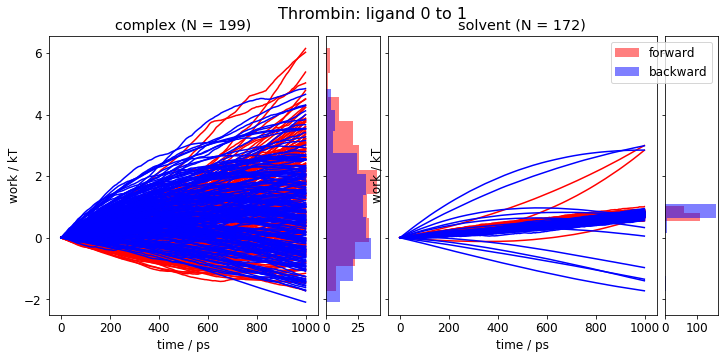

8 outliers filtered with a std of 3
18 outliers filtered with a std of 3


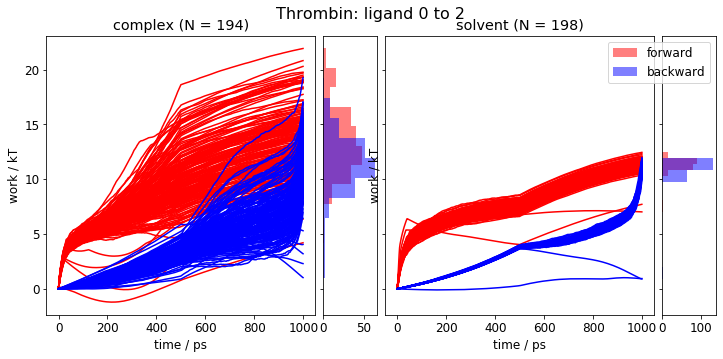

2 outliers filtered with a std of 3
13 outliers filtered with a std of 3


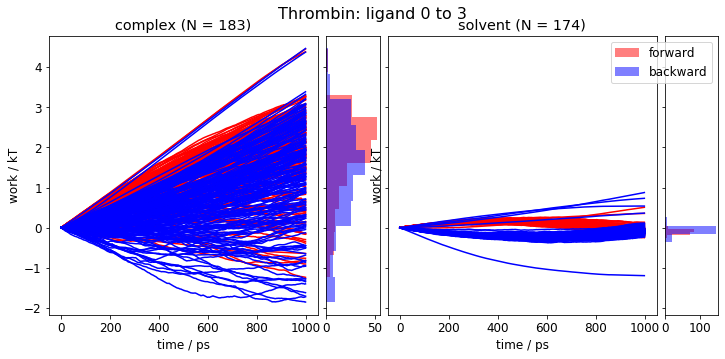

2 outliers filtered with a std of 3
6 outliers filtered with a std of 3


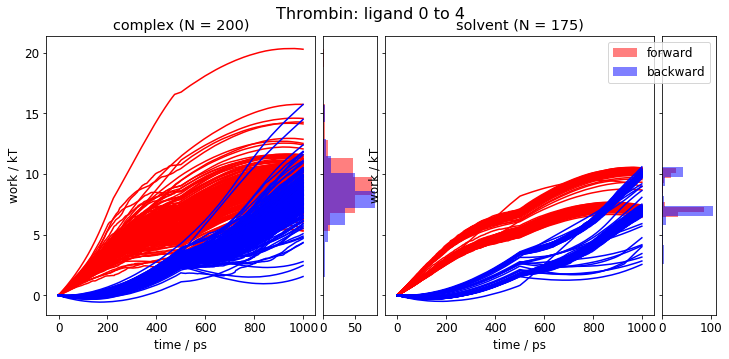

11 outliers filtered with a std of 3
6 outliers filtered with a std of 3


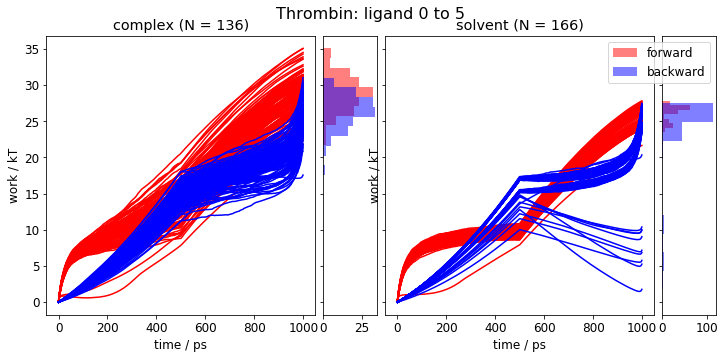

12 outliers filtered with a std of 3
10 outliers filtered with a std of 3


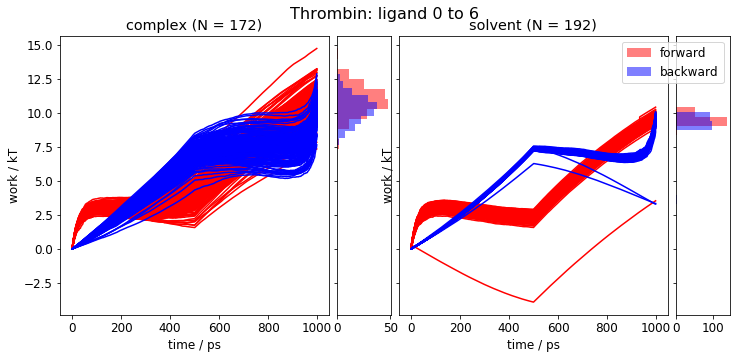

2 outliers filtered with a std of 3
2 outliers filtered with a std of 3


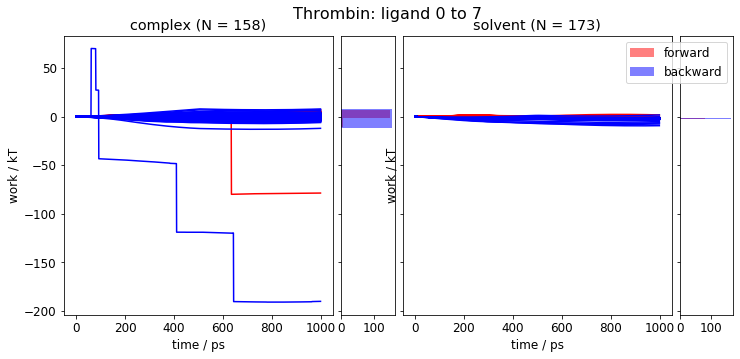

5 outliers filtered with a std of 3
12 outliers filtered with a std of 3


/Users/brucemah/miniconda3/lib/python3.6/site-packages/numpy/lib/histograms.py:824: RuntimeWarning:

invalid value encountered in greater_equal

/Users/brucemah/miniconda3/lib/python3.6/site-packages/numpy/lib/histograms.py:825: RuntimeWarning:

invalid value encountered in less_equal



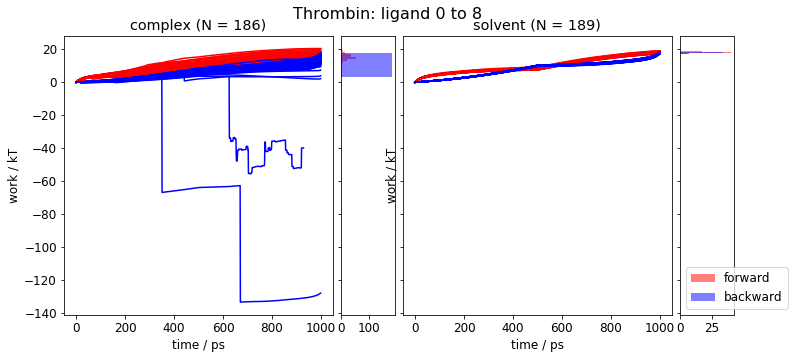

/Users/brucemah/miniconda3/lib/python3.6/site-packages/pymbar/bar.py:135: RuntimeWarning:

invalid value encountered in less

/Users/brucemah/miniconda3/lib/python3.6/site-packages/pymbar/bar.py:118: RuntimeWarning:

invalid value encountered in less



3 outliers filtered with a std of 3
1 outliers filtered with a std of 3


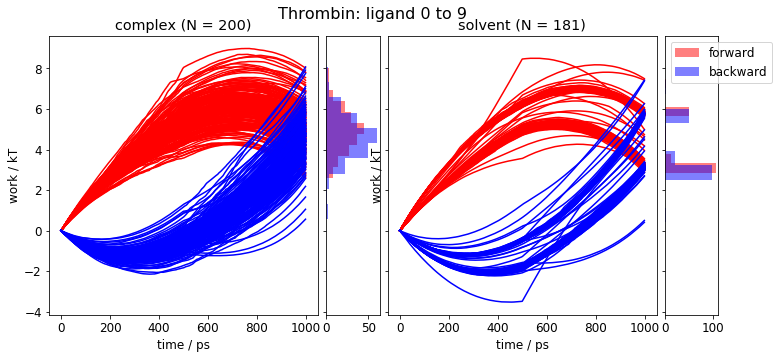

0 outliers filtered with a std of 3
13 outliers filtered with a std of 3


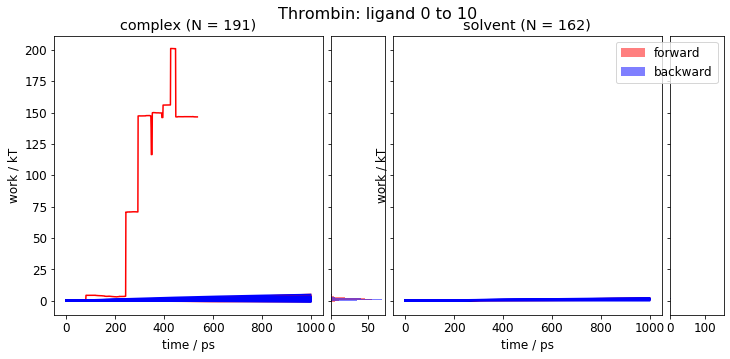

9 outliers filtered with a std of 3
15 outliers filtered with a std of 3


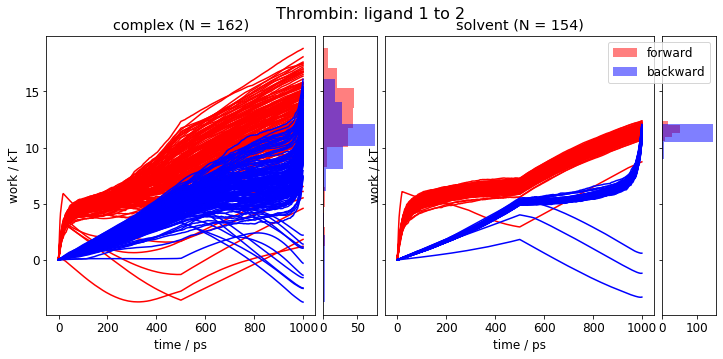

0 outliers filtered with a std of 3
12 outliers filtered with a std of 3


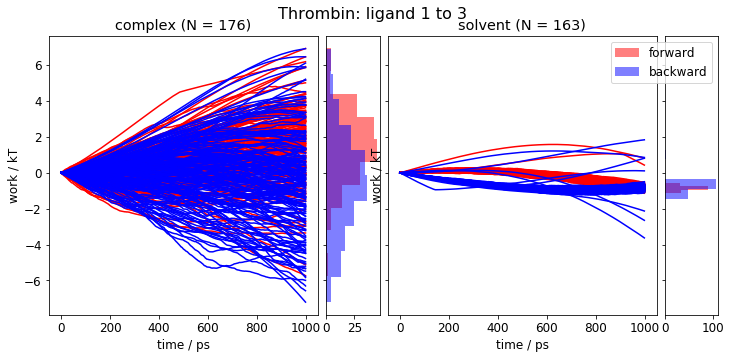

4 outliers filtered with a std of 3
6 outliers filtered with a std of 3


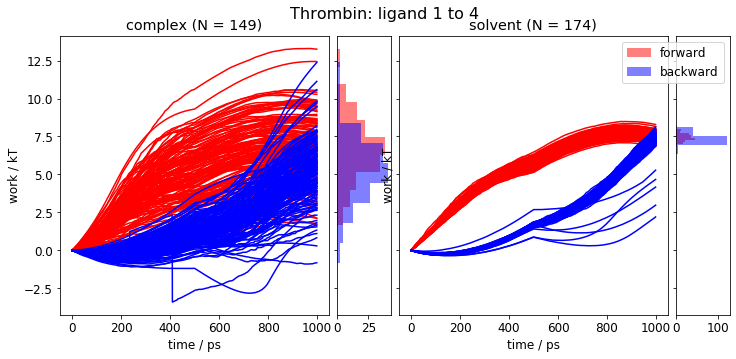

10 outliers filtered with a std of 3
14 outliers filtered with a std of 3


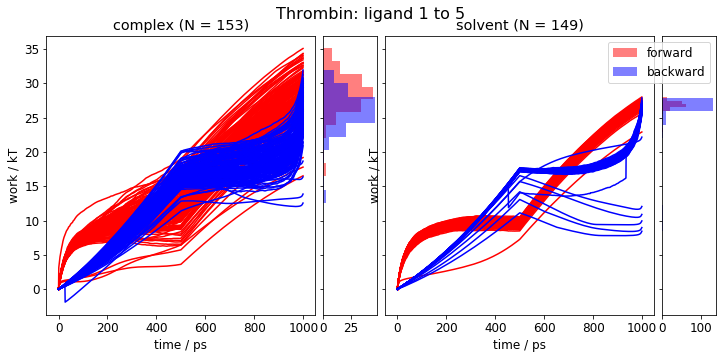

3 outliers filtered with a std of 3
9 outliers filtered with a std of 3


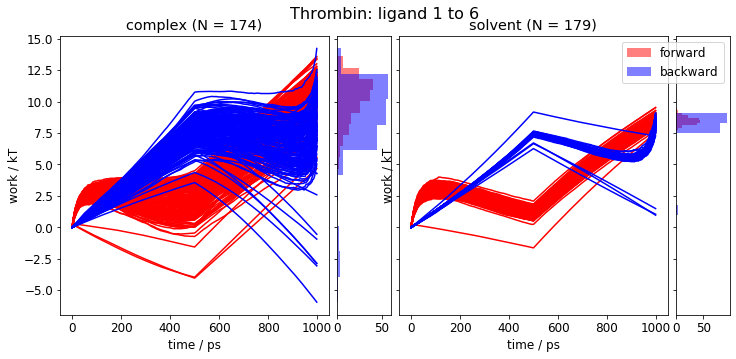

4 outliers filtered with a std of 3
14 outliers filtered with a std of 3


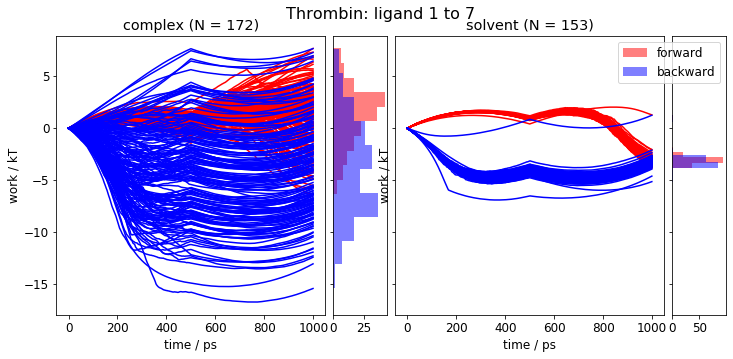

6 outliers filtered with a std of 3
6 outliers filtered with a std of 3


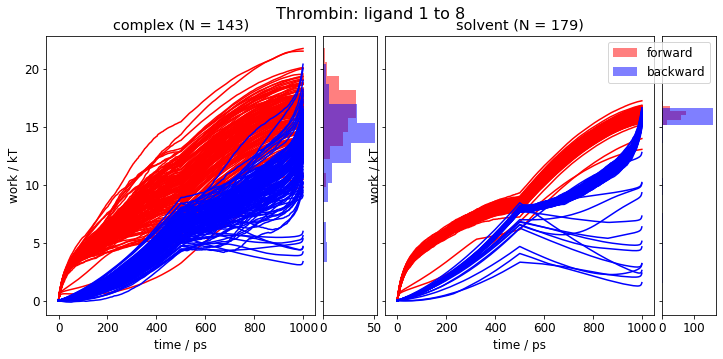

2 outliers filtered with a std of 3
2 outliers filtered with a std of 3


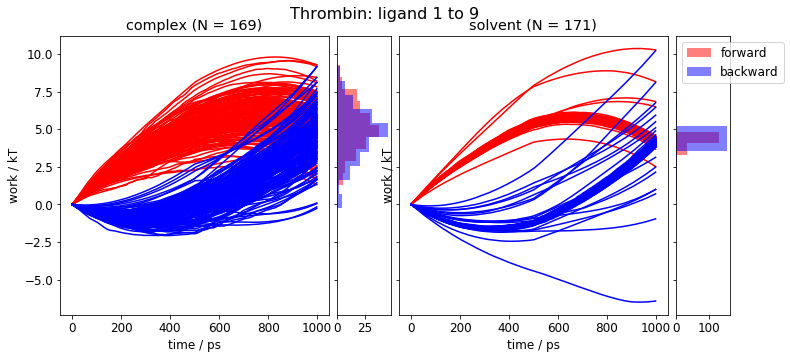

3 outliers filtered with a std of 3
12 outliers filtered with a std of 3


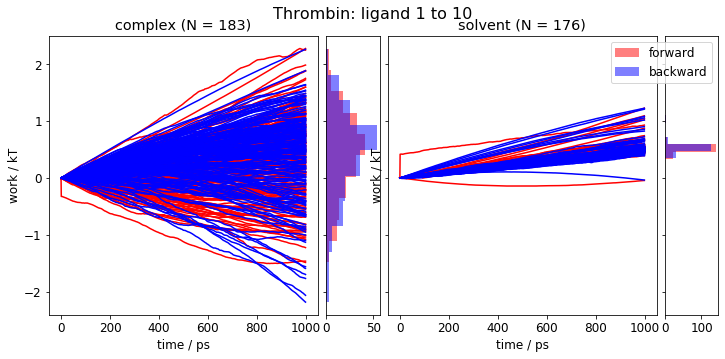

11 outliers filtered with a std of 3
18 outliers filtered with a std of 3


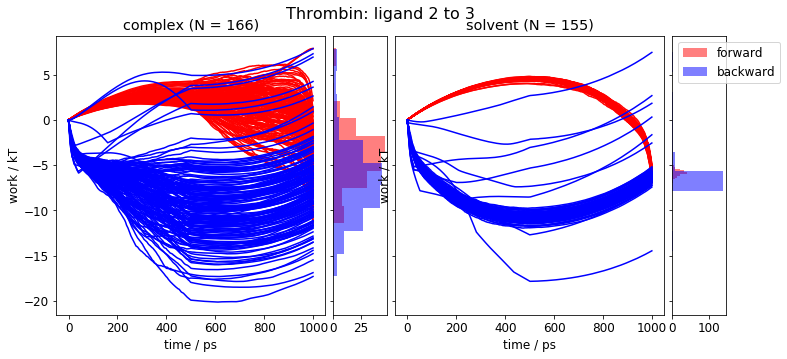

2 outliers filtered with a std of 3
6 outliers filtered with a std of 3


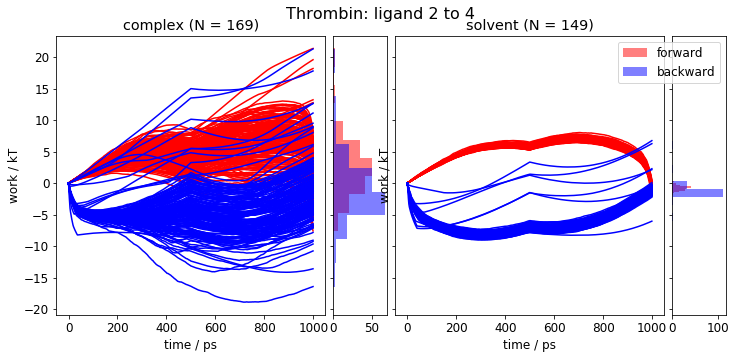

9 outliers filtered with a std of 3
7 outliers filtered with a std of 3


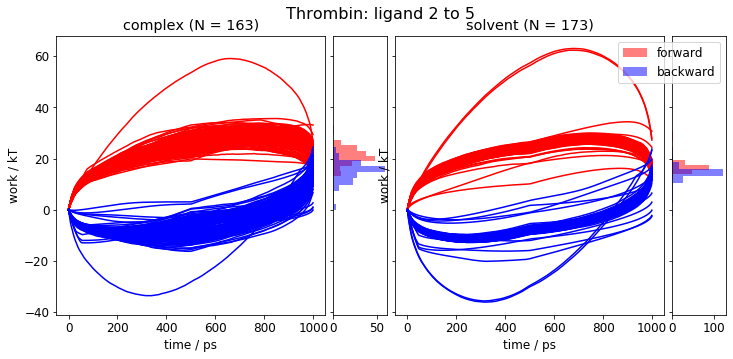

10 outliers filtered with a std of 3
11 outliers filtered with a std of 3


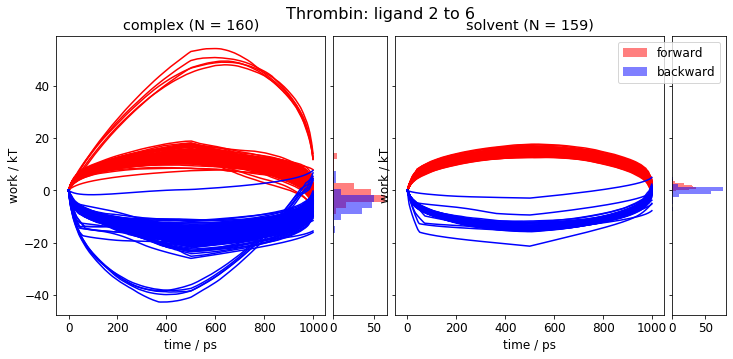

13 outliers filtered with a std of 3
14 outliers filtered with a std of 3


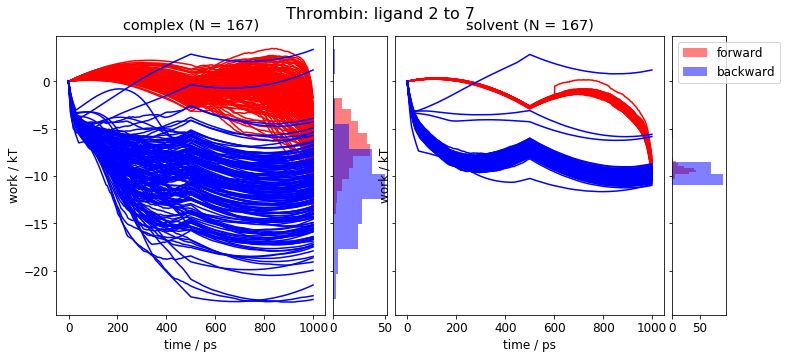

2 outliers filtered with a std of 3
11 outliers filtered with a std of 3


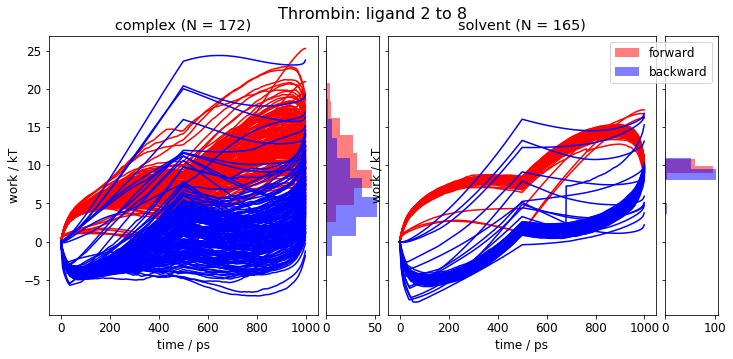

7 outliers filtered with a std of 3
16 outliers filtered with a std of 3


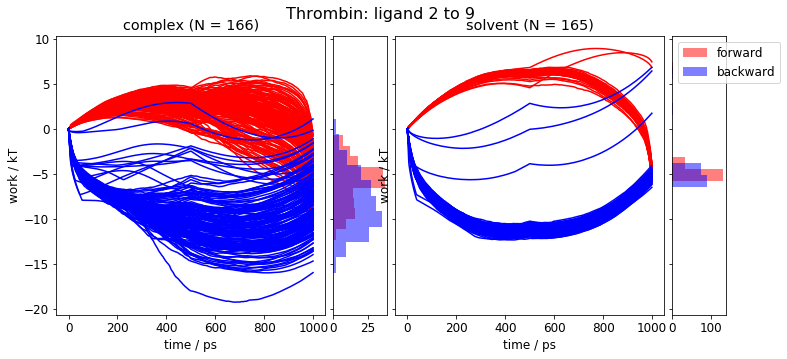

13 outliers filtered with a std of 3
17 outliers filtered with a std of 3


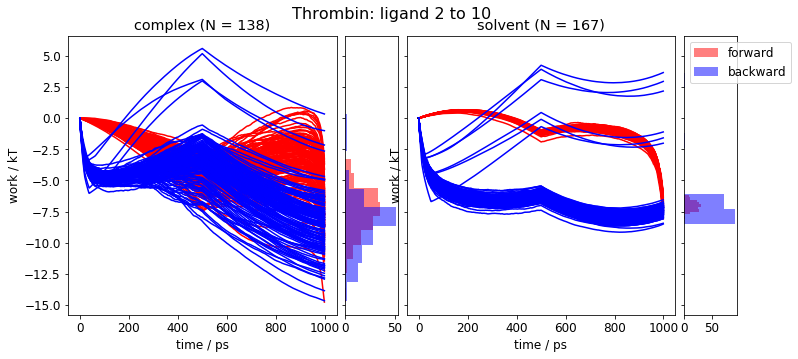

6 outliers filtered with a std of 3
10 outliers filtered with a std of 3


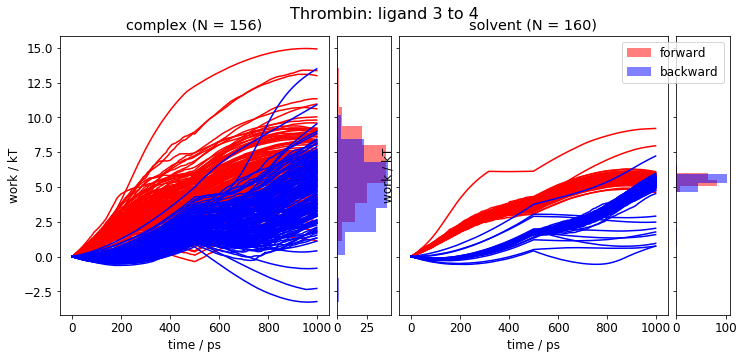

10 outliers filtered with a std of 3
10 outliers filtered with a std of 3


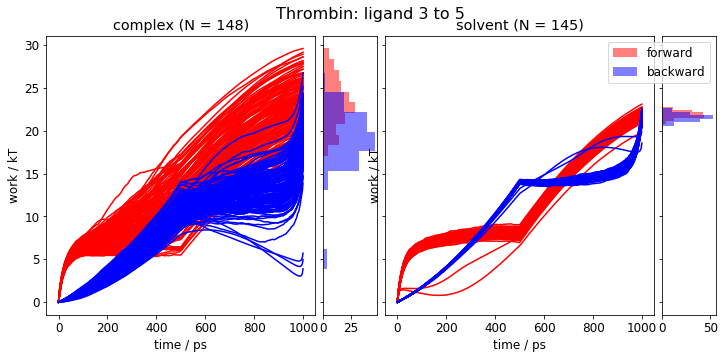

8 outliers filtered with a std of 3
14 outliers filtered with a std of 3


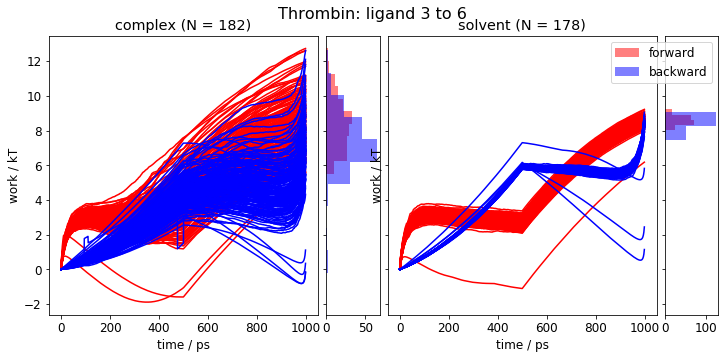

2 outliers filtered with a std of 3
8 outliers filtered with a std of 3


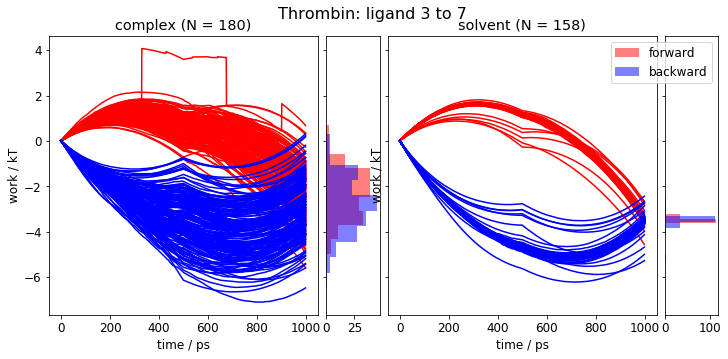

10 outliers filtered with a std of 3
11 outliers filtered with a std of 3


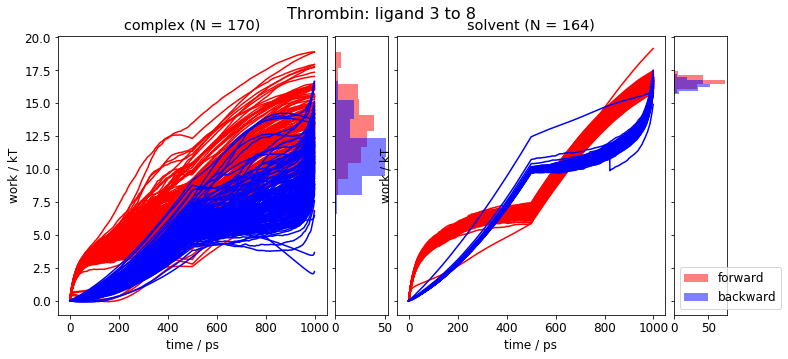

2 outliers filtered with a std of 3
11 outliers filtered with a std of 3


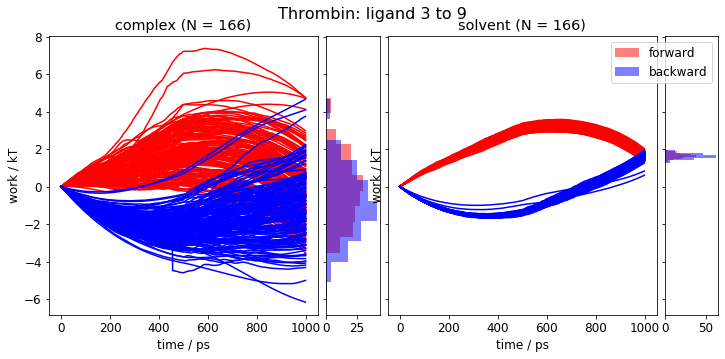

4 outliers filtered with a std of 3
9 outliers filtered with a std of 3


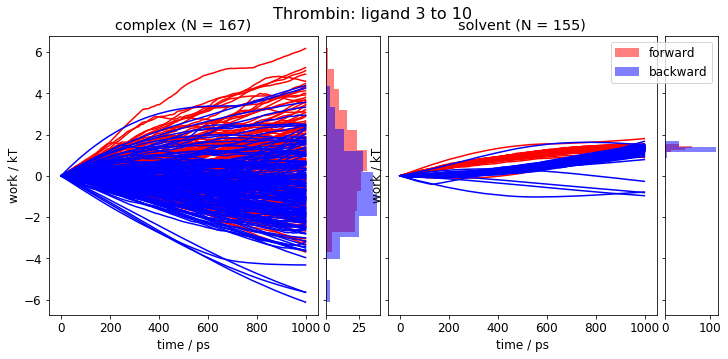

12 outliers filtered with a std of 3
2 outliers filtered with a std of 3


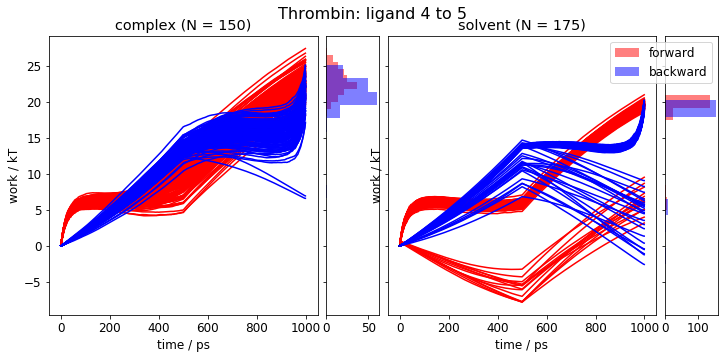

5 outliers filtered with a std of 3
12 outliers filtered with a std of 3


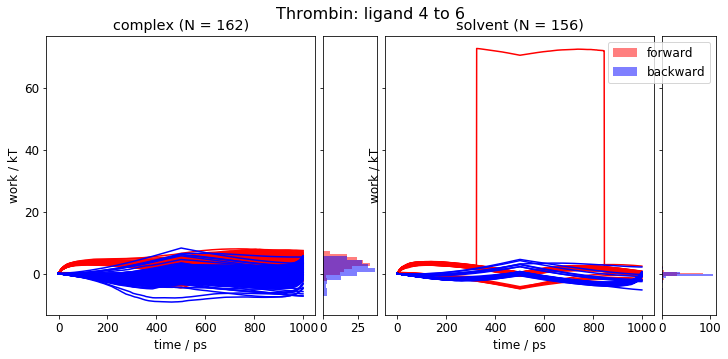

3 outliers filtered with a std of 3
13 outliers filtered with a std of 3


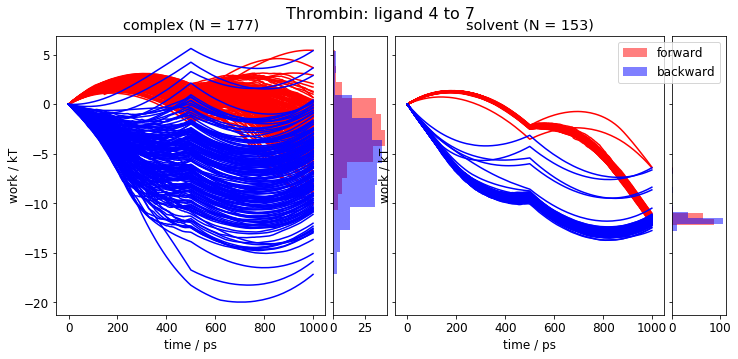

15 outliers filtered with a std of 3
11 outliers filtered with a std of 3


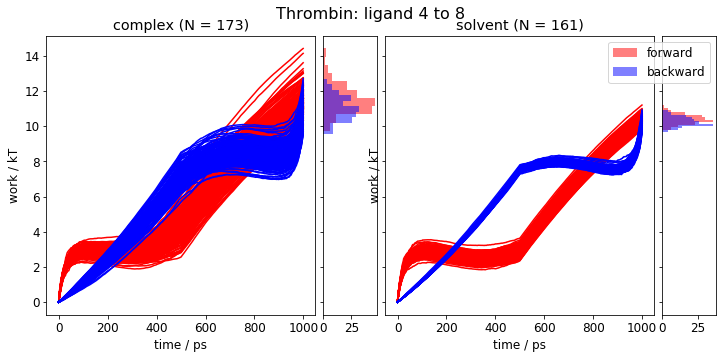

4 outliers filtered with a std of 3
8 outliers filtered with a std of 3


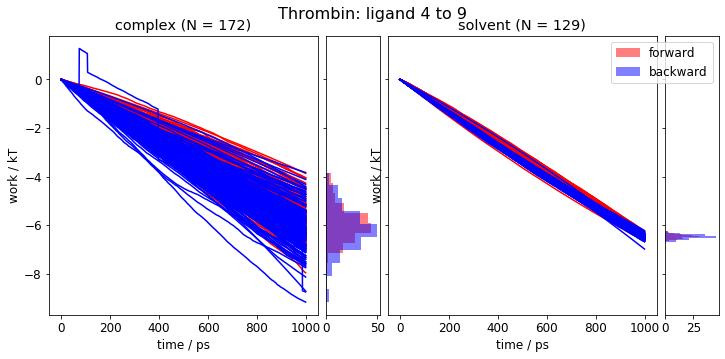

5 outliers filtered with a std of 3
9 outliers filtered with a std of 3


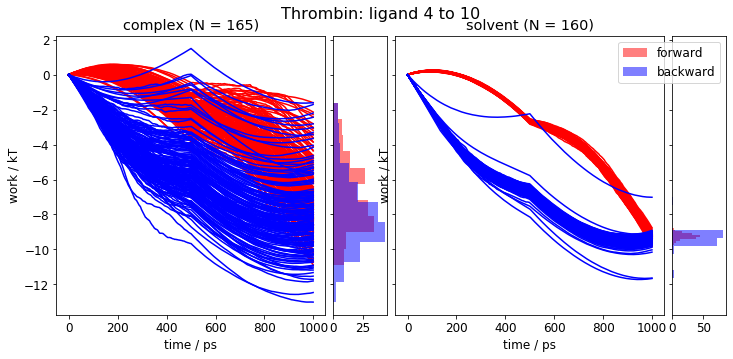

2 outliers filtered with a std of 3
9 outliers filtered with a std of 3


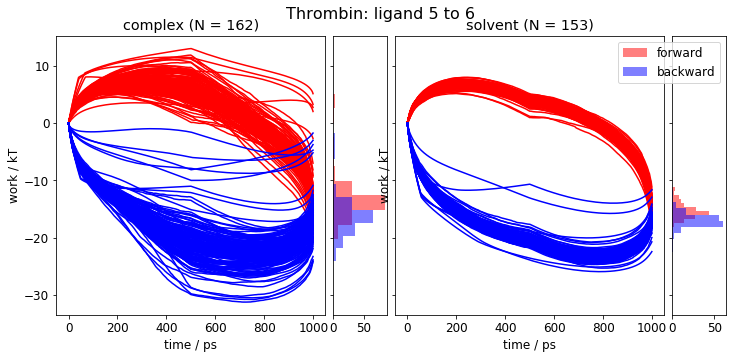

13 outliers filtered with a std of 3
6 outliers filtered with a std of 3


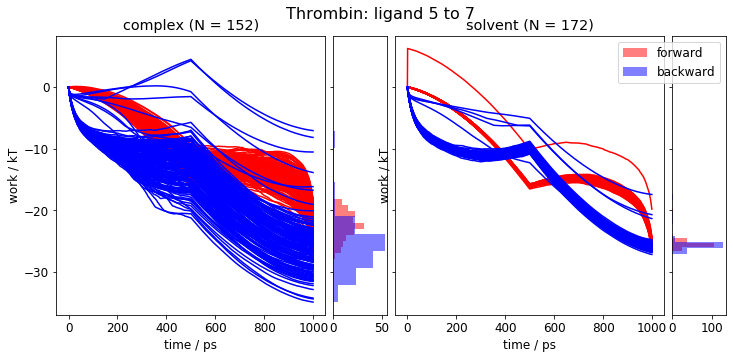

4 outliers filtered with a std of 3
8 outliers filtered with a std of 3


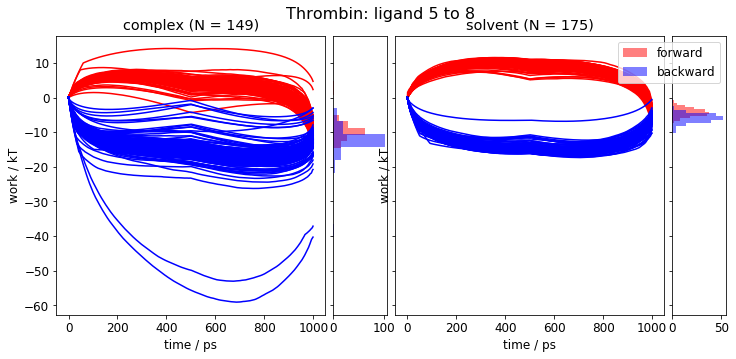

15 outliers filtered with a std of 3
15 outliers filtered with a std of 3


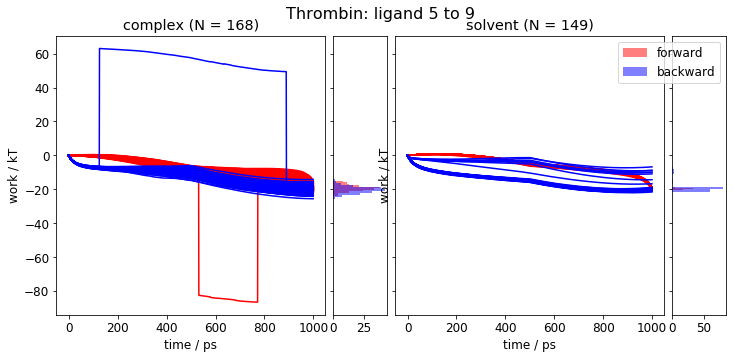

12 outliers filtered with a std of 3
14 outliers filtered with a std of 3


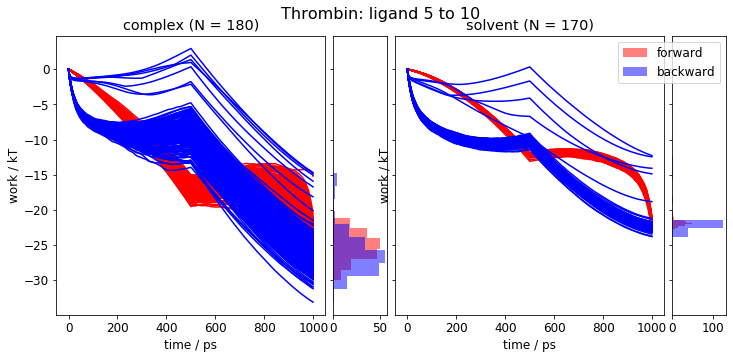

9 outliers filtered with a std of 3
10 outliers filtered with a std of 3


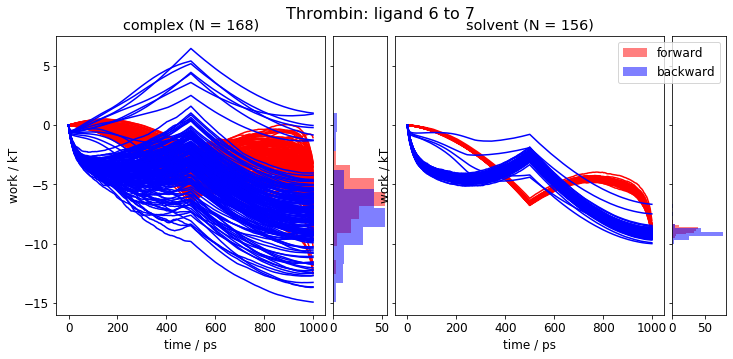

1 outliers filtered with a std of 3
11 outliers filtered with a std of 3


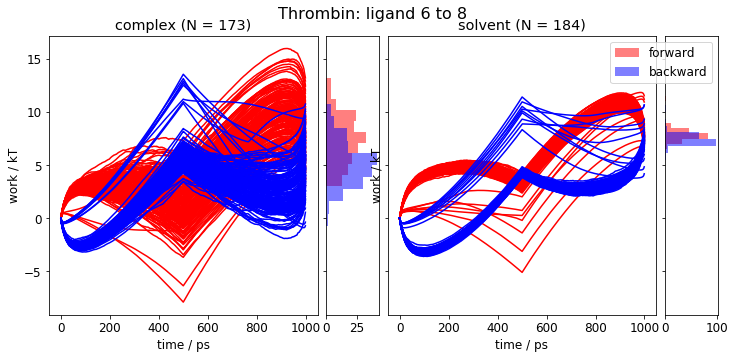

8 outliers filtered with a std of 3
16 outliers filtered with a std of 3


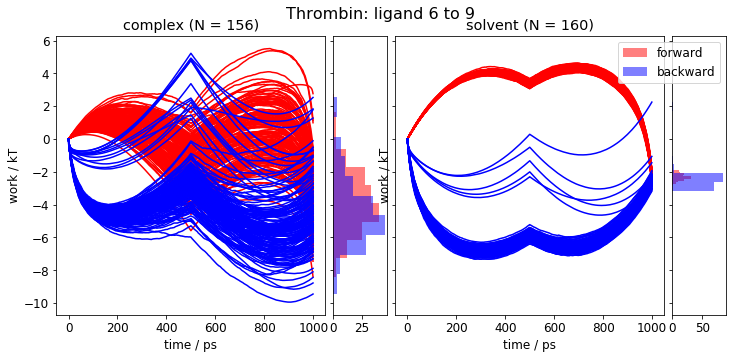

9 outliers filtered with a std of 3
14 outliers filtered with a std of 3


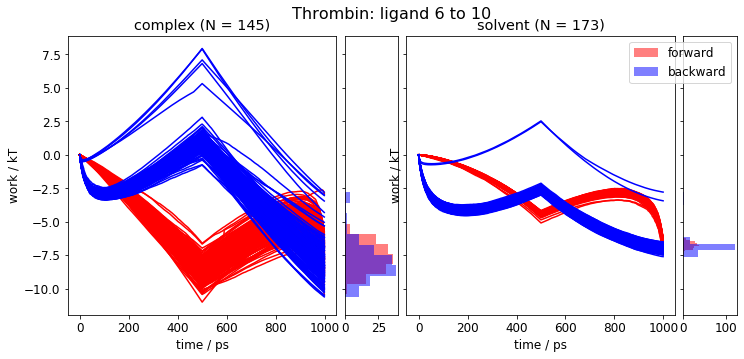

8 outliers filtered with a std of 3
17 outliers filtered with a std of 3


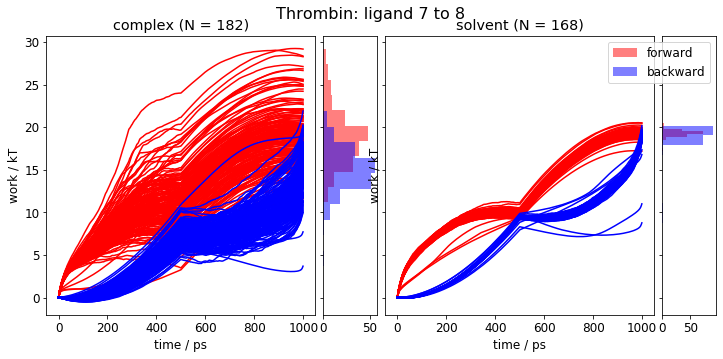

5 outliers filtered with a std of 3
6 outliers filtered with a std of 3


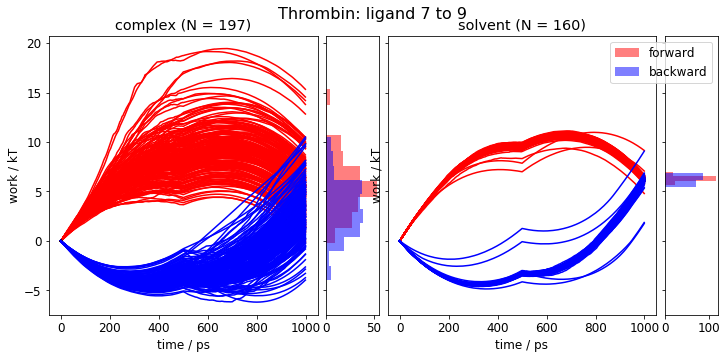

3 outliers filtered with a std of 3
14 outliers filtered with a std of 3


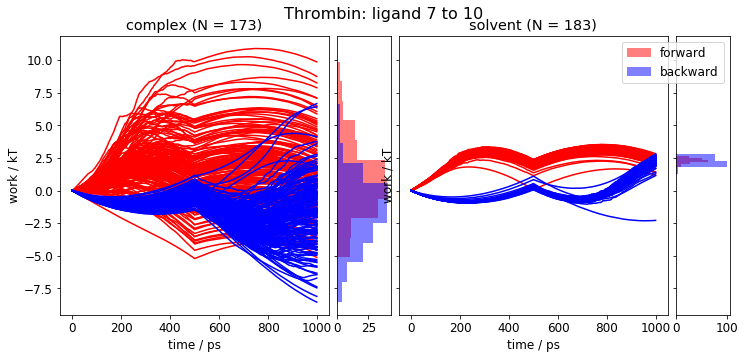

12 outliers filtered with a std of 3
14 outliers filtered with a std of 3


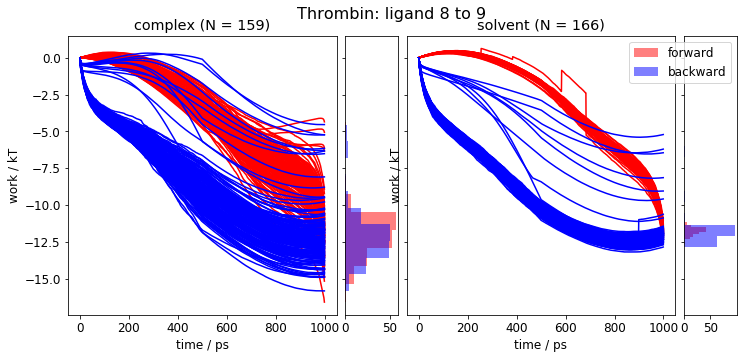

5 outliers filtered with a std of 3
11 outliers filtered with a std of 3


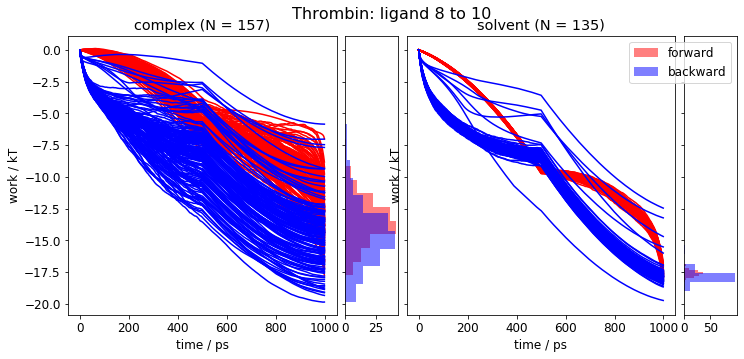

2 outliers filtered with a std of 3
8 outliers filtered with a std of 3


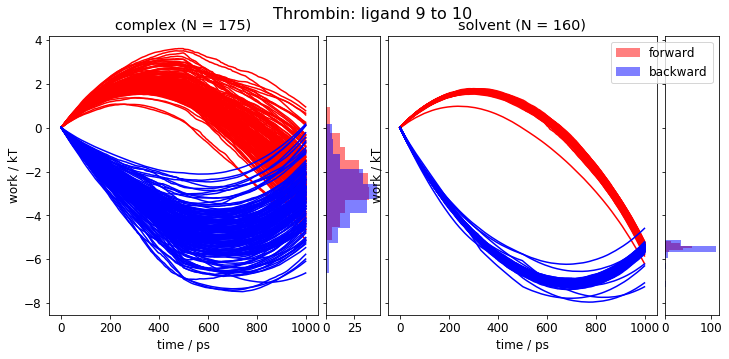

2 outliers filtered with a std of 3
7 outliers filtered with a std of 3


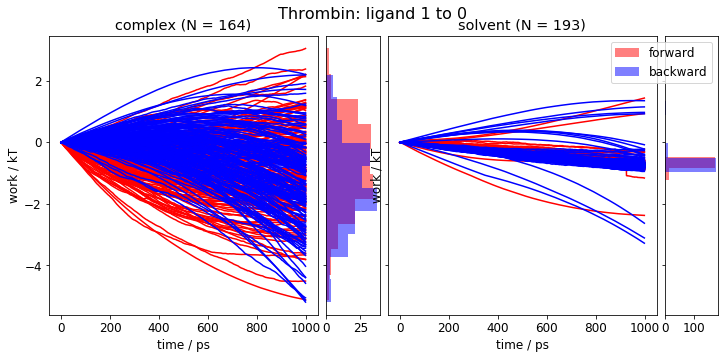

9 outliers filtered with a std of 3
19 outliers filtered with a std of 3


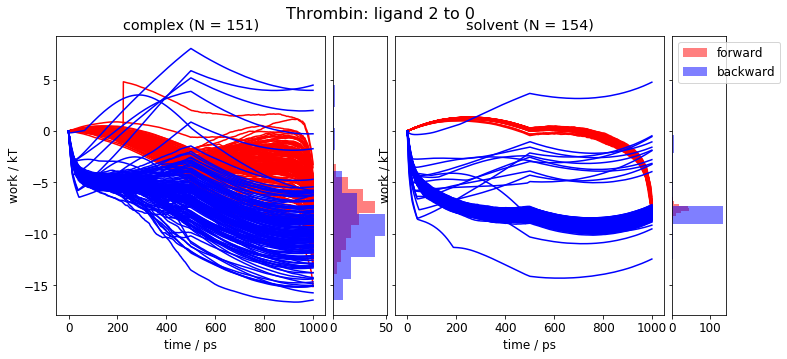

4 outliers filtered with a std of 3
11 outliers filtered with a std of 3


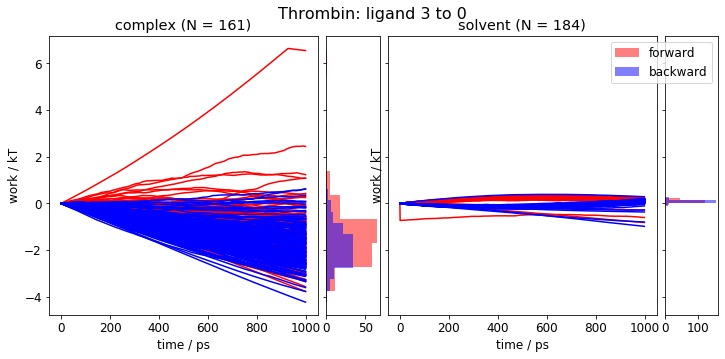

8 outliers filtered with a std of 3
8 outliers filtered with a std of 3


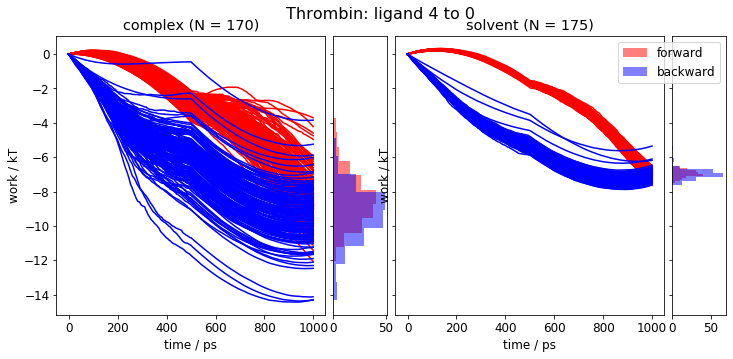

13 outliers filtered with a std of 3
18 outliers filtered with a std of 3


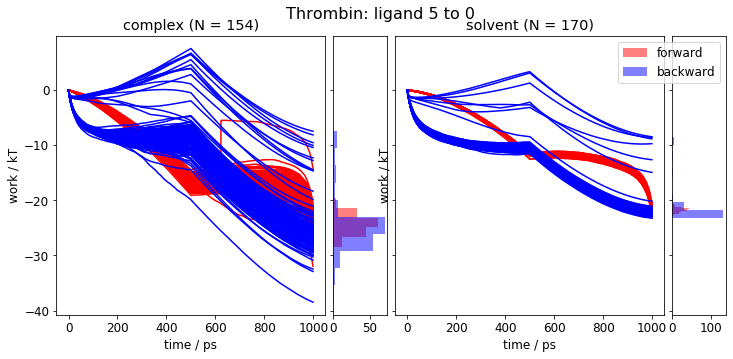

12 outliers filtered with a std of 3
15 outliers filtered with a std of 3


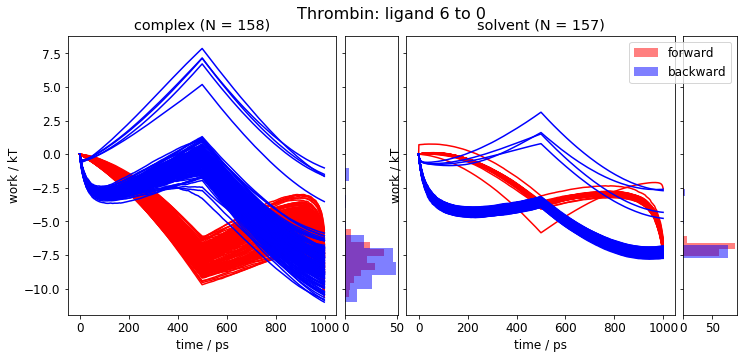

6 outliers filtered with a std of 3
9 outliers filtered with a std of 3


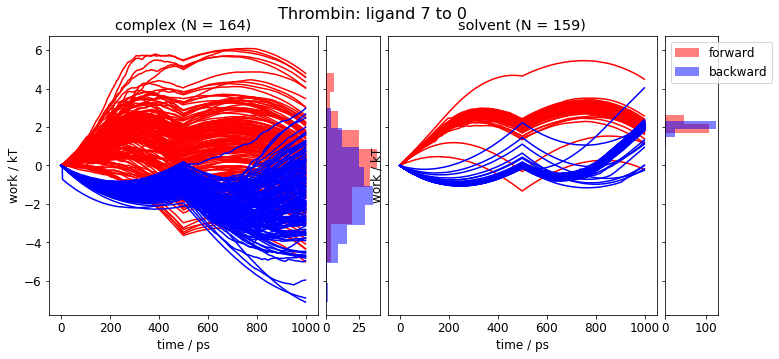

16 outliers filtered with a std of 3
17 outliers filtered with a std of 3


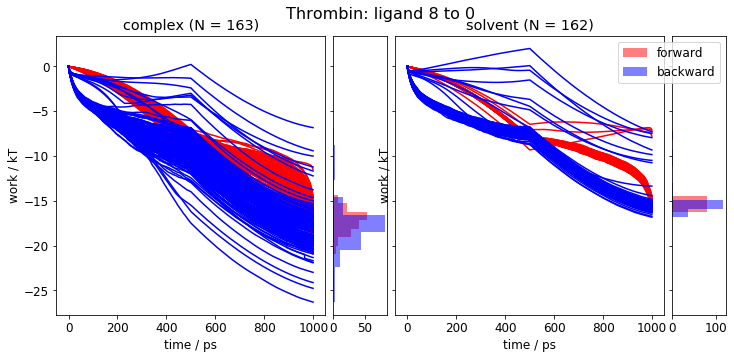

4 outliers filtered with a std of 3
11 outliers filtered with a std of 3


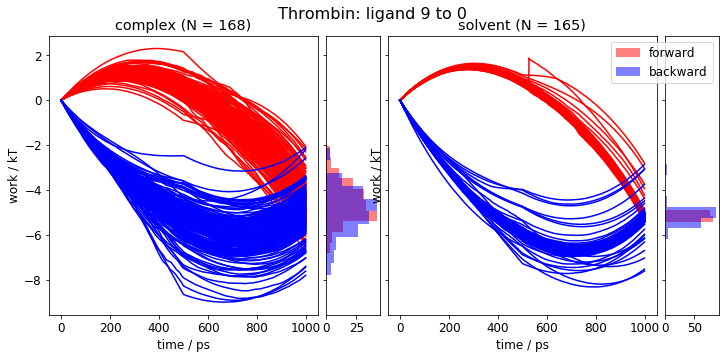

1 outliers filtered with a std of 3
2 outliers filtered with a std of 3


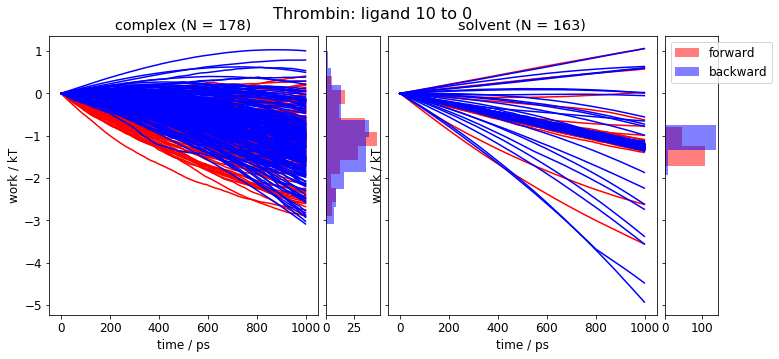

10 outliers filtered with a std of 3
13 outliers filtered with a std of 3


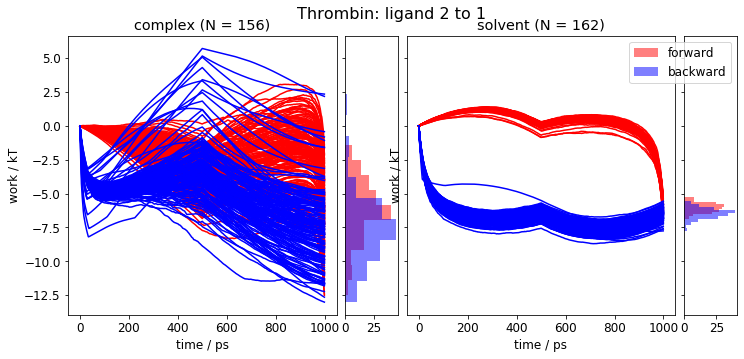

3 outliers filtered with a std of 3
12 outliers filtered with a std of 3


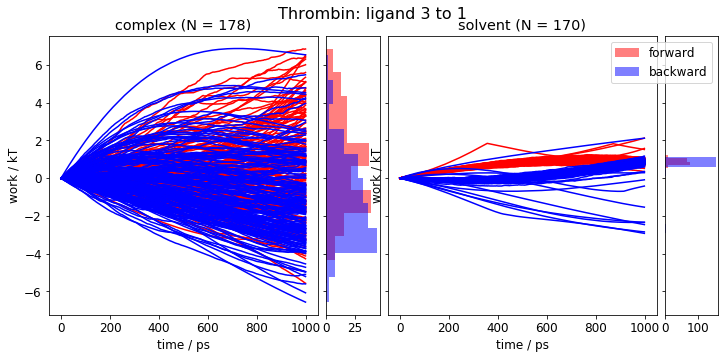

2 outliers filtered with a std of 3
8 outliers filtered with a std of 3


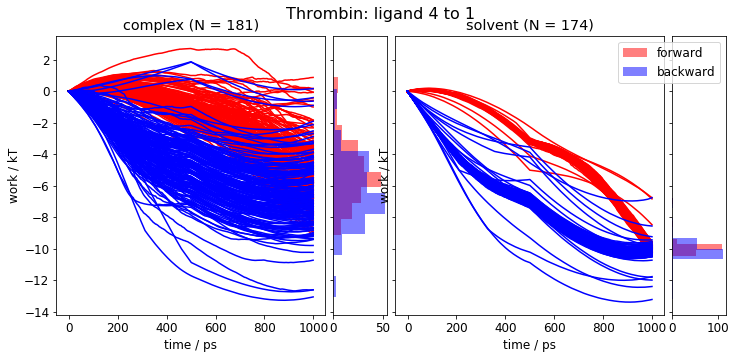

7 outliers filtered with a std of 3
11 outliers filtered with a std of 3


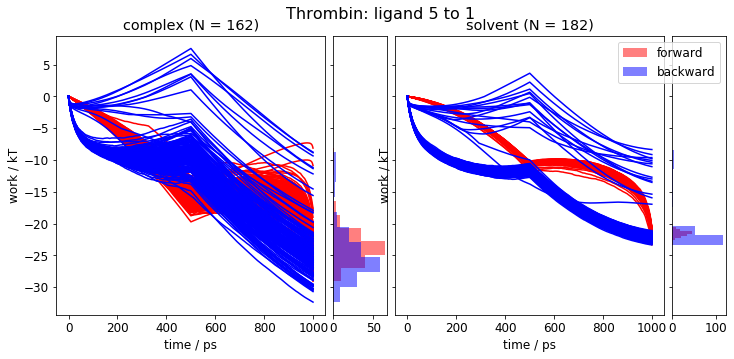

6 outliers filtered with a std of 3
11 outliers filtered with a std of 3


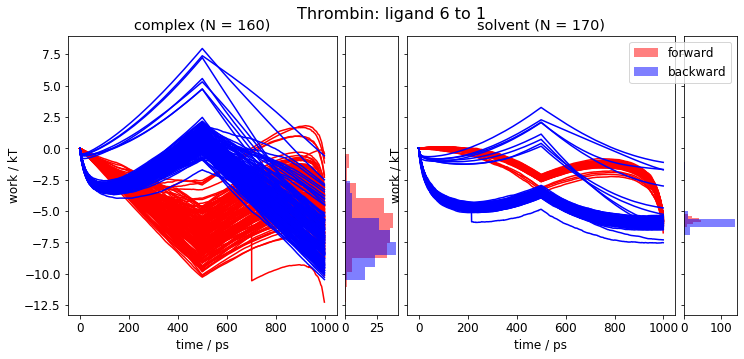

4 outliers filtered with a std of 3
13 outliers filtered with a std of 3


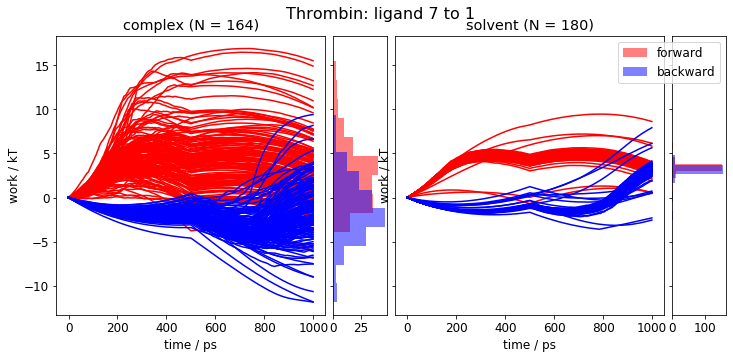

5 outliers filtered with a std of 3
8 outliers filtered with a std of 3


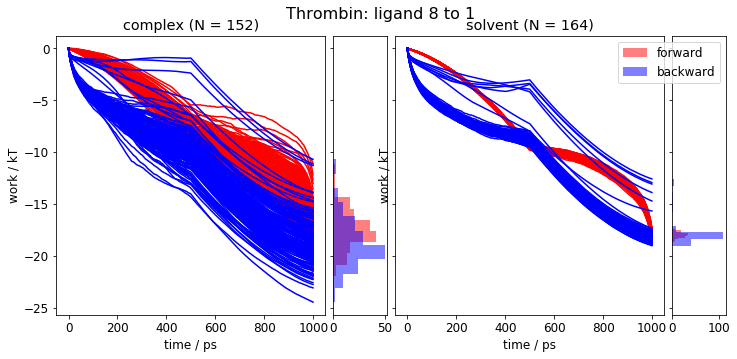

4 outliers filtered with a std of 3
6 outliers filtered with a std of 3


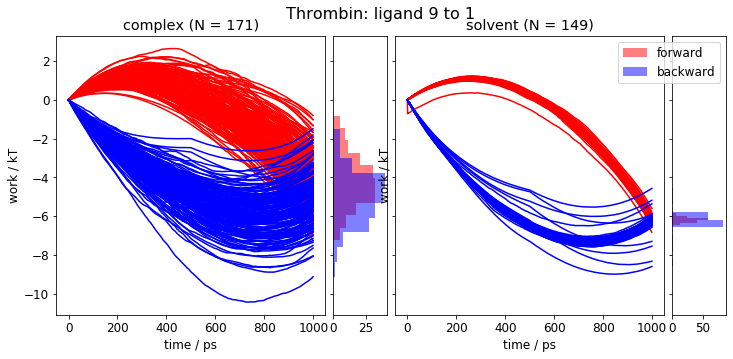

2 outliers filtered with a std of 3
10 outliers filtered with a std of 3


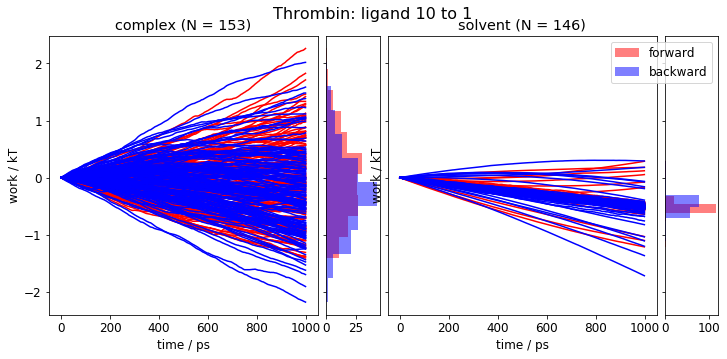

11 outliers filtered with a std of 3
14 outliers filtered with a std of 3


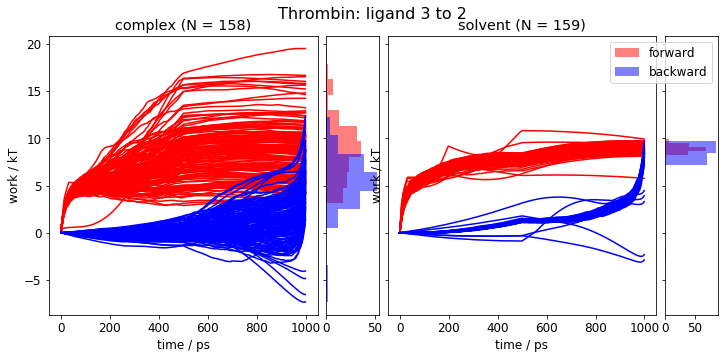

6 outliers filtered with a std of 3
11 outliers filtered with a std of 3


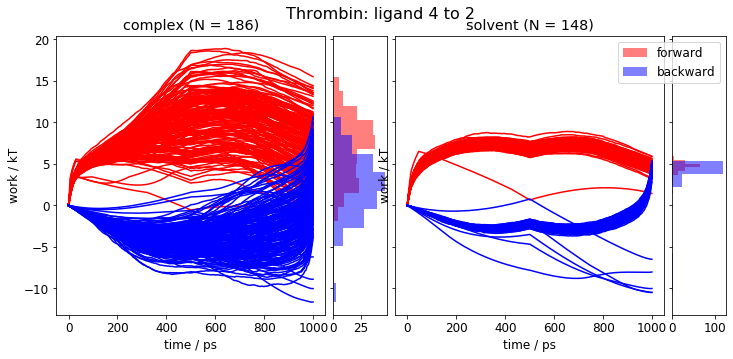

7 outliers filtered with a std of 3
8 outliers filtered with a std of 3


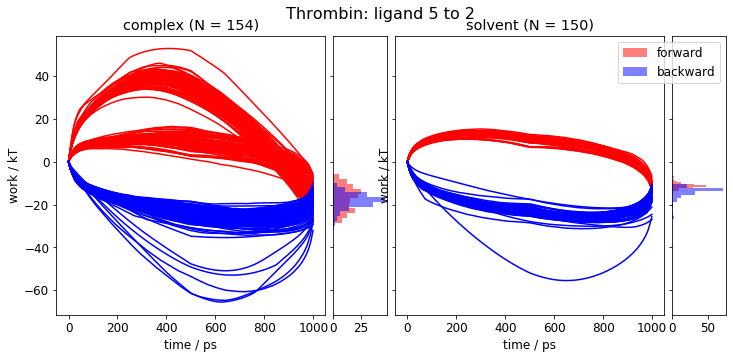

8 outliers filtered with a std of 3
9 outliers filtered with a std of 3


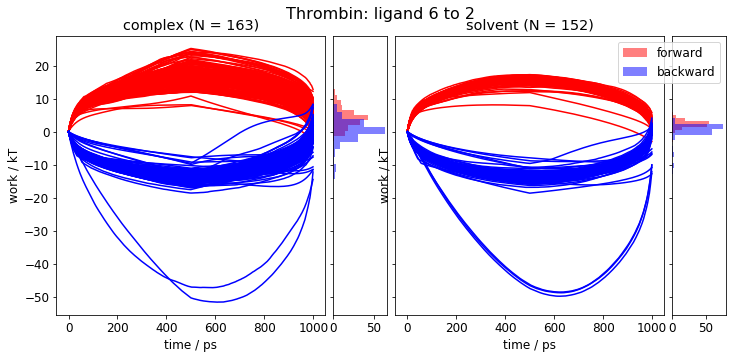

10 outliers filtered with a std of 3
14 outliers filtered with a std of 3


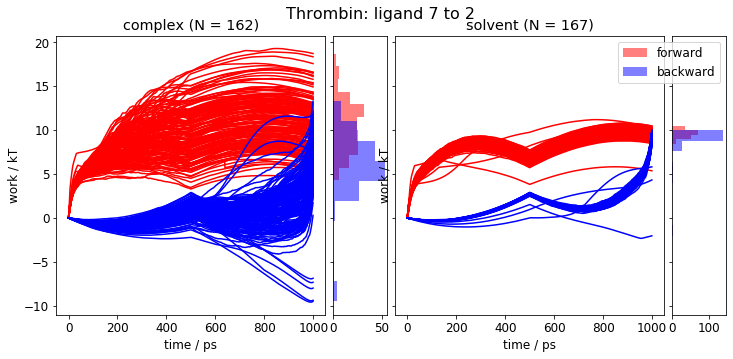

0 outliers filtered with a std of 3
10 outliers filtered with a std of 3


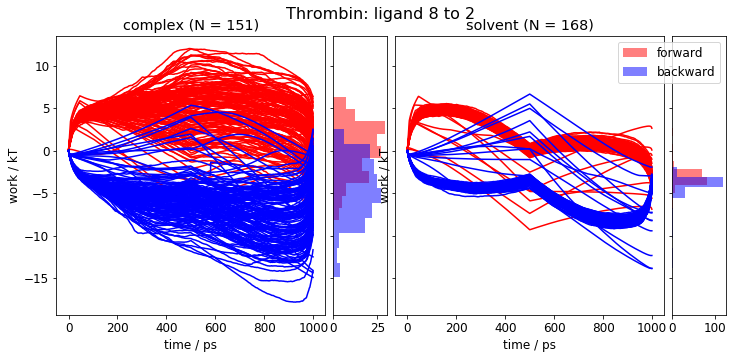

7 outliers filtered with a std of 3
2 outliers filtered with a std of 3


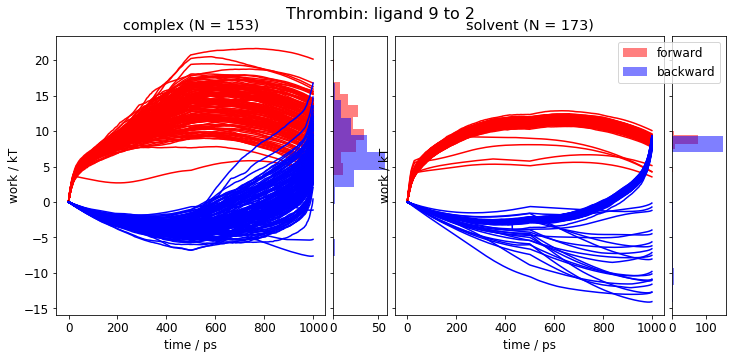

11 outliers filtered with a std of 3
3 outliers filtered with a std of 3


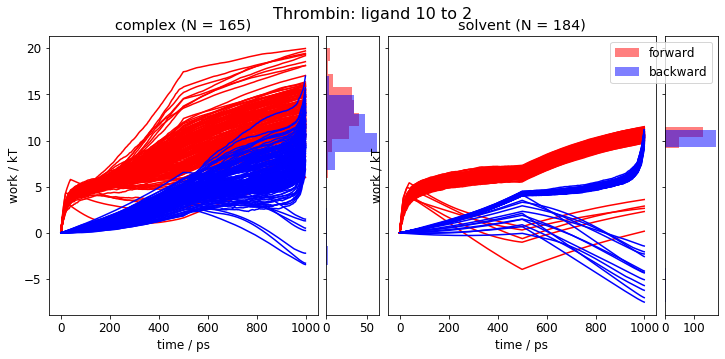

5 outliers filtered with a std of 3
14 outliers filtered with a std of 3


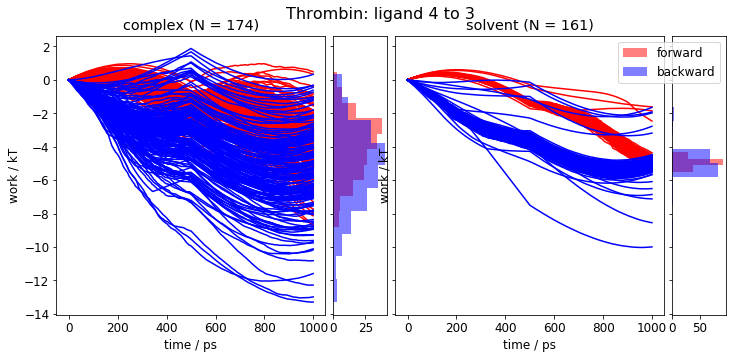

2 outliers filtered with a std of 3
2 outliers filtered with a std of 3


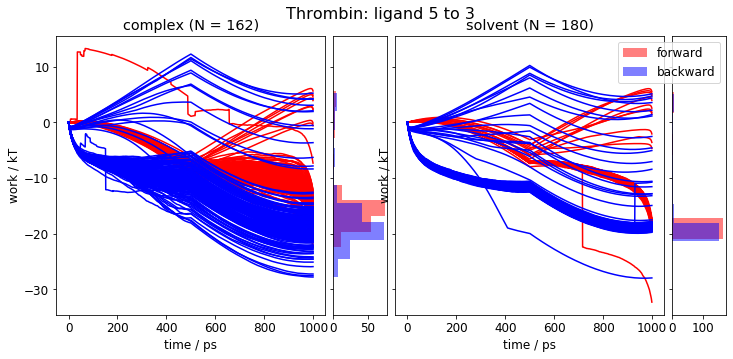

2 outliers filtered with a std of 3
9 outliers filtered with a std of 3


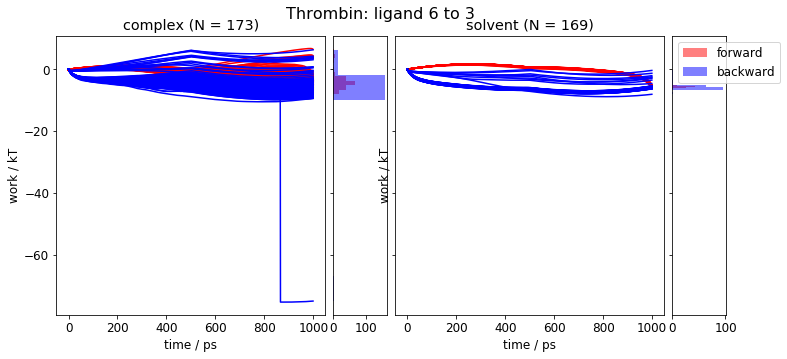

4 outliers filtered with a std of 3
14 outliers filtered with a std of 3


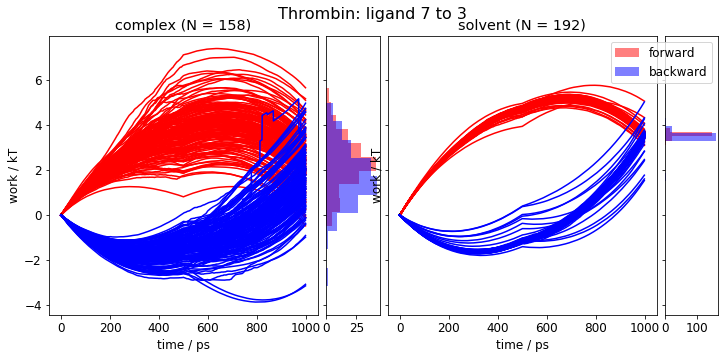

6 outliers filtered with a std of 3
9 outliers filtered with a std of 3


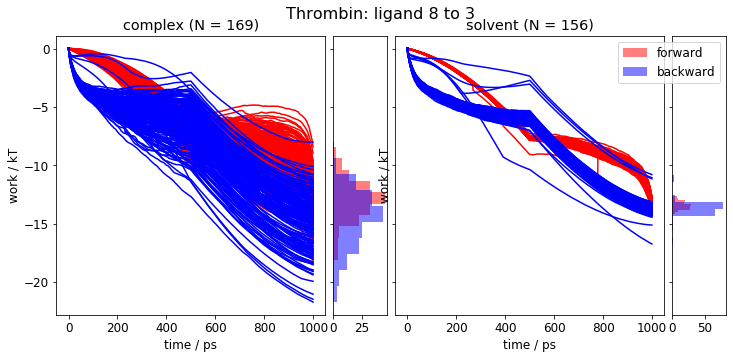

4 outliers filtered with a std of 3
8 outliers filtered with a std of 3


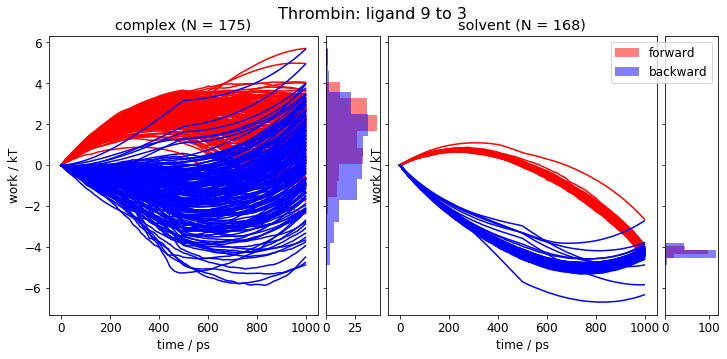

1 outliers filtered with a std of 3
14 outliers filtered with a std of 3


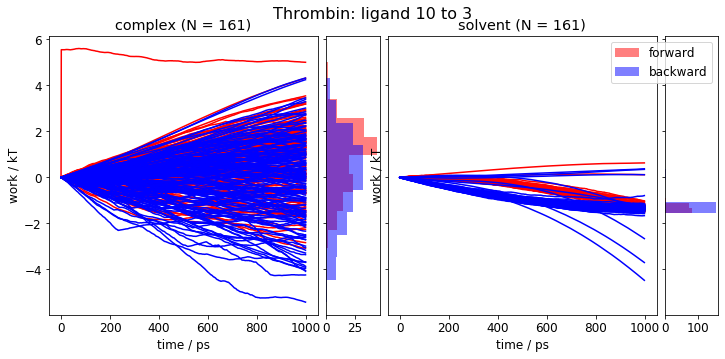

14 outliers filtered with a std of 3
13 outliers filtered with a std of 3


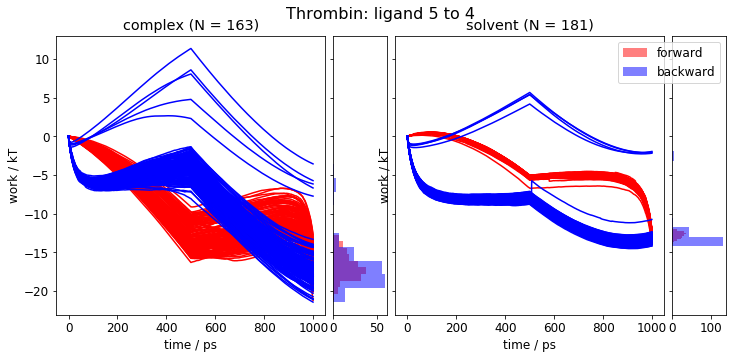

7 outliers filtered with a std of 3
12 outliers filtered with a std of 3


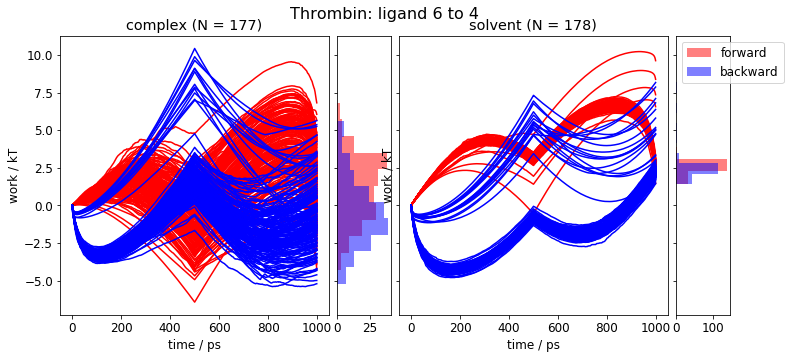

6 outliers filtered with a std of 3
16 outliers filtered with a std of 3


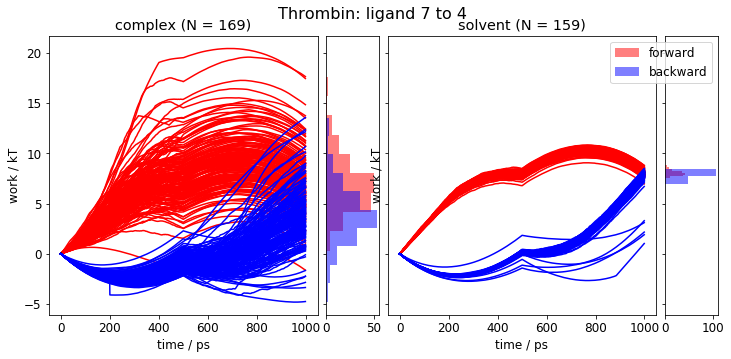

12 outliers filtered with a std of 3
7 outliers filtered with a std of 3


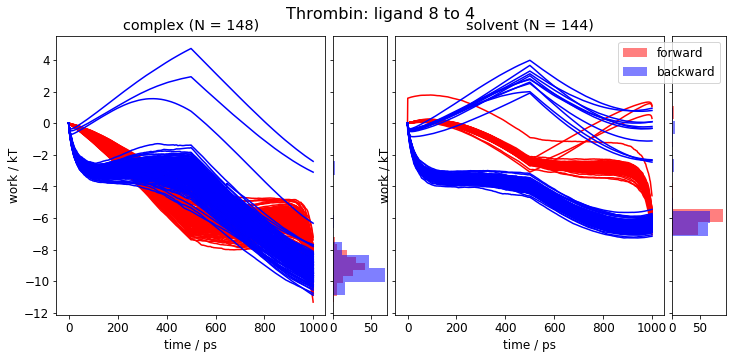

3 outliers filtered with a std of 3
3 outliers filtered with a std of 3


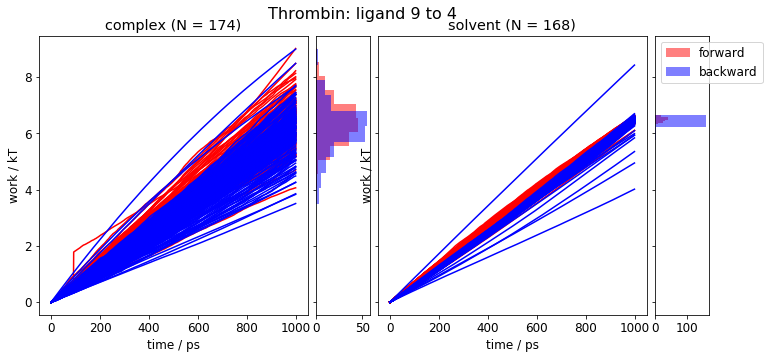

5 outliers filtered with a std of 3
8 outliers filtered with a std of 3


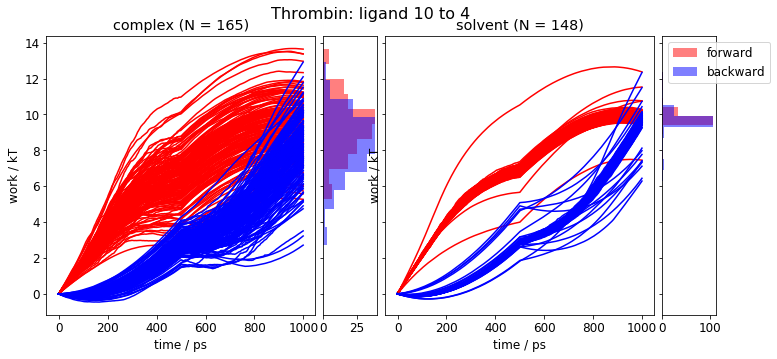

7 outliers filtered with a std of 3
11 outliers filtered with a std of 3


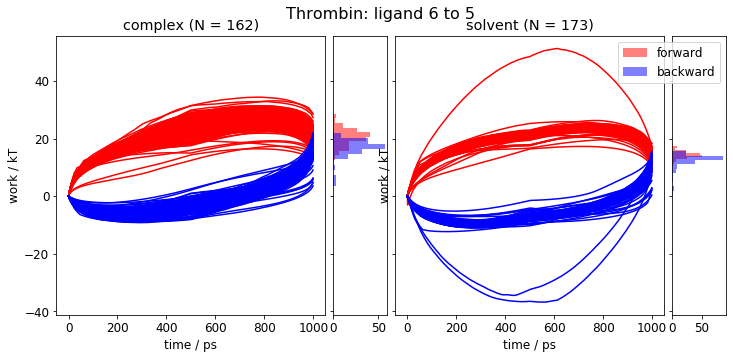

11 outliers filtered with a std of 3
12 outliers filtered with a std of 3


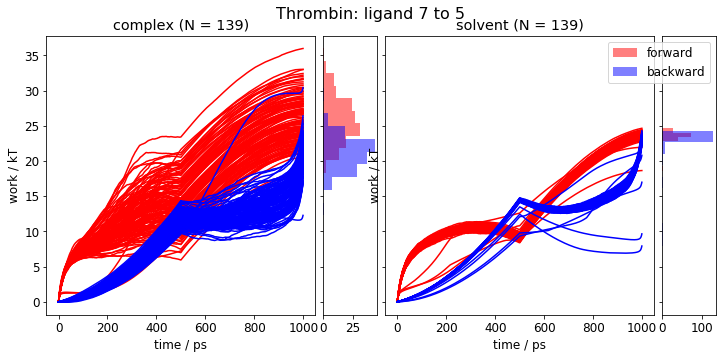

8 outliers filtered with a std of 3
10 outliers filtered with a std of 3


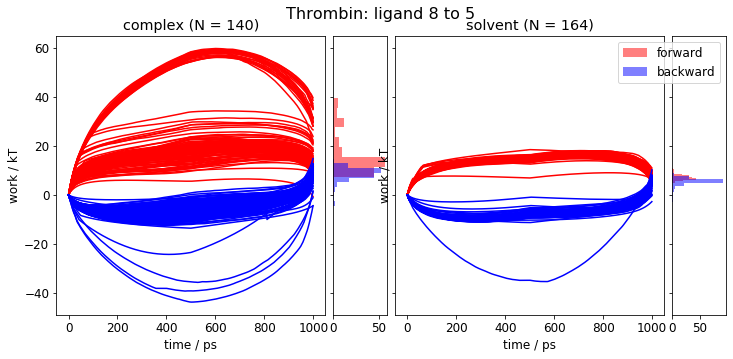

14 outliers filtered with a std of 3
11 outliers filtered with a std of 3


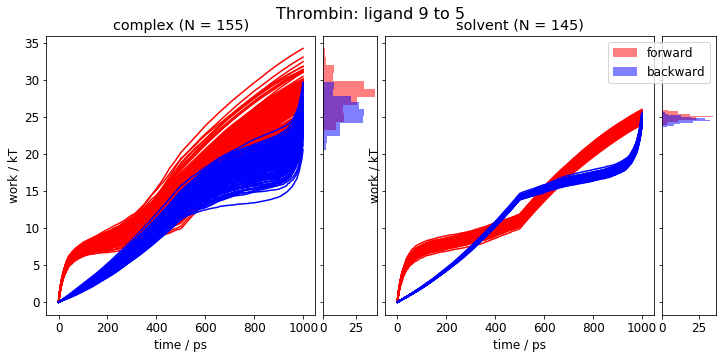

2 outliers filtered with a std of 3
15 outliers filtered with a std of 3


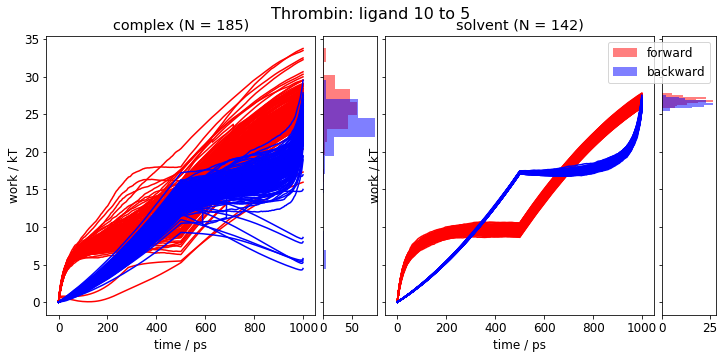

7 outliers filtered with a std of 3
12 outliers filtered with a std of 3


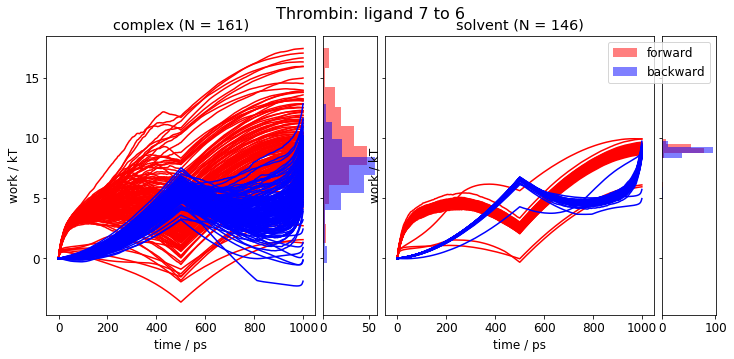

4 outliers filtered with a std of 3
6 outliers filtered with a std of 3


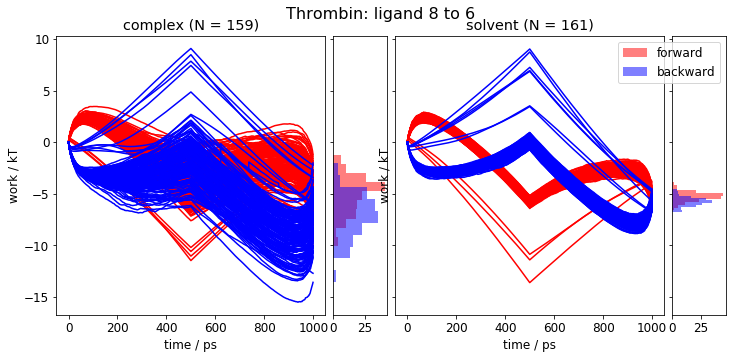

8 outliers filtered with a std of 3
6 outliers filtered with a std of 3


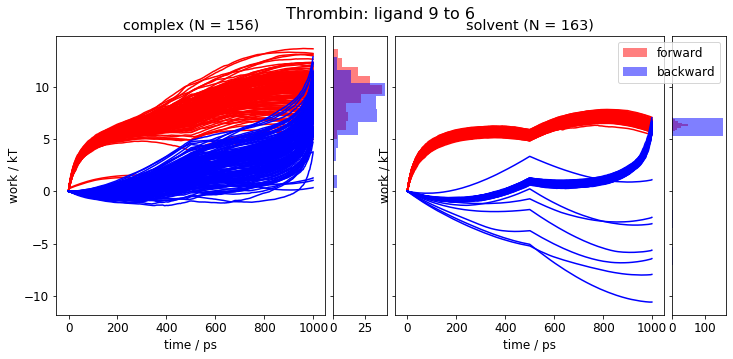

12 outliers filtered with a std of 3
13 outliers filtered with a std of 3


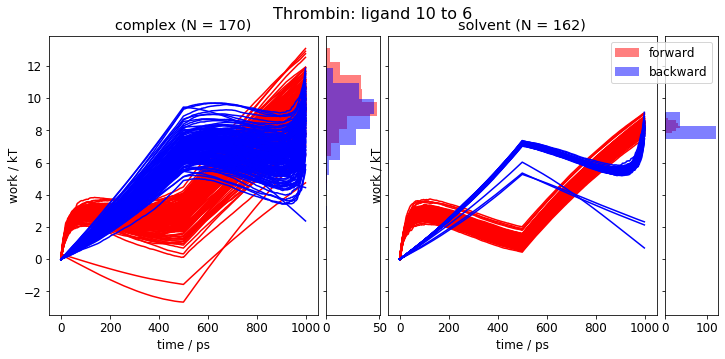

12 outliers filtered with a std of 3
8 outliers filtered with a std of 3


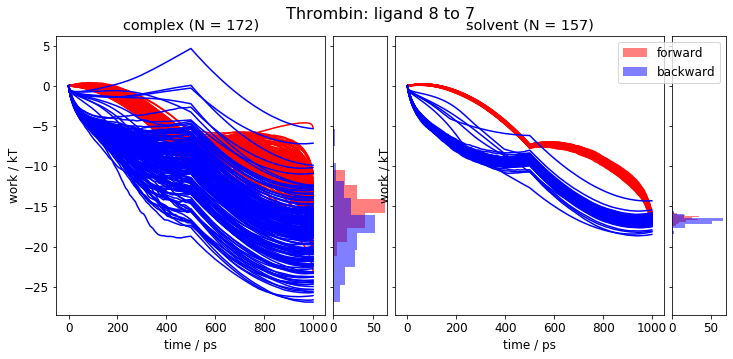

5 outliers filtered with a std of 3
13 outliers filtered with a std of 3


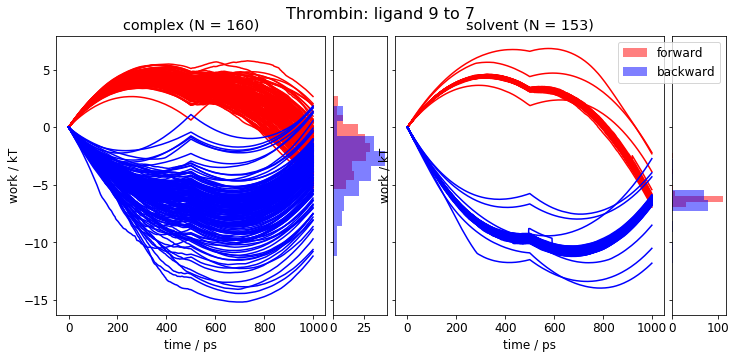

3 outliers filtered with a std of 3
2 outliers filtered with a std of 3


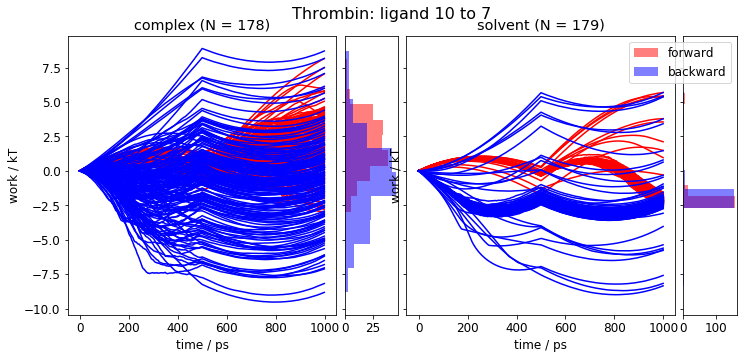

11 outliers filtered with a std of 3
9 outliers filtered with a std of 3


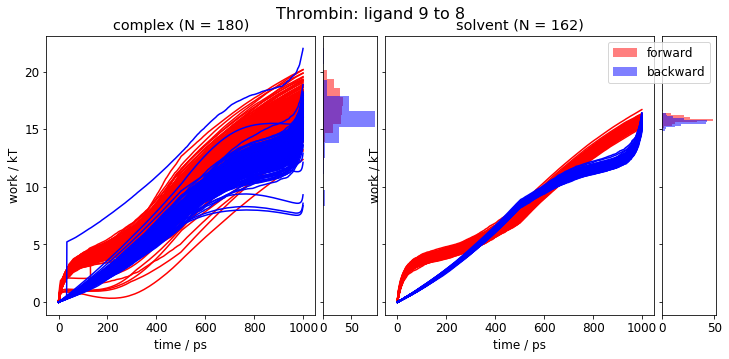

9 outliers filtered with a std of 3
14 outliers filtered with a std of 3


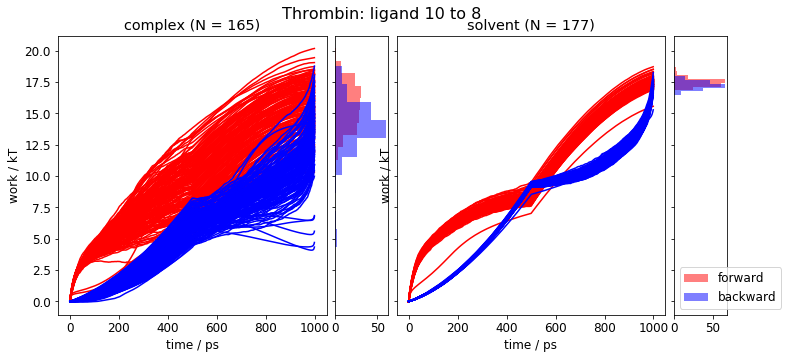

3 outliers filtered with a std of 3
9 outliers filtered with a std of 3


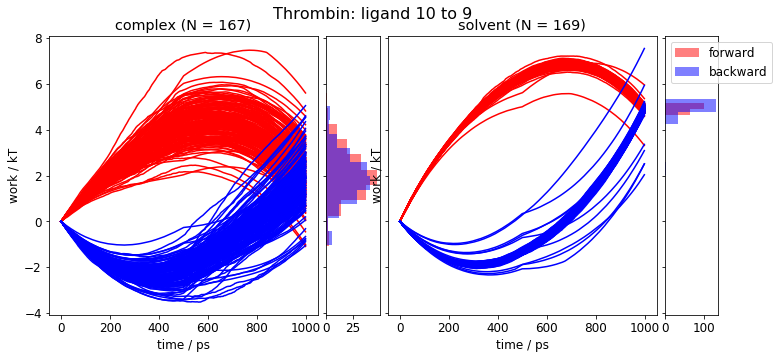

In [139]:
# TODO sort so that forwards and backwards are next to eachother
for index in range(0,110): # Just thrombin for now
    RUN = f'RUN{index}'
    if RUN in work[projects['complex']].keys() and RUN in work[projects['solvent']].keys():
        d = details[RUN] 
        forward_work_complex, reverse_work_complex =  collect_works(work[projects['complex']][RUN])
        forward_work_solvent, reverse_work_solvent =  collect_works(work[projects['solvent']][RUN])

        forward_work_complex, reverse_work_complex  = _strip_outliers(forward_work_complex,reverse_work_complex)
        forward_work_solvent, reverse_work_solvent  = _strip_outliers(forward_work_solvent,reverse_work_solvent)
        
        plot_work_distribution(forward_work_complex, reverse_work_complex, forward_work_solvent, reverse_work_solvent,title=f"{d['protein_pdb'].split('_')[0]}: ligand {d['start_ligand']} to {d['end_ligand']}")  
        
        complex_fes = np.zeros(shape=(n_boots))
        n_samples = len(forward_work_complex[:,-1])
        for i in range(n_boots):
            samples = np.random.choice(range(n_samples),n_samples)
            complex_fes[i] = BAR(forward_work_complex[:,-1][samples],reverse_work_complex[:,-1][samples])[0]
            
        solvent_fes = np.zeros(shape=(n_boots))
        n_samples = len(forward_work_solvent[:,-1])
        for i in range(n_boots):
            samples = np.random.choice(range(n_samples),n_samples)
            solvent_fes[i] = BAR(forward_work_solvent[:,-1][samples],reverse_work_solvent[:,-1][samples])[0]                      

        d = details[RUN]    
        details[RUN]['complex_fes'] = complex_fes
        details[RUN]['solvent_fes'] = solvent_fes
        details[RUN]['calculated'] = np.mean(solvent_fes) - np.mean(complex_fes)
        details[RUN]['calculated_err'] = (np.std(solvent_fes)**2 + np.std(complex_fes)**2)**0.5

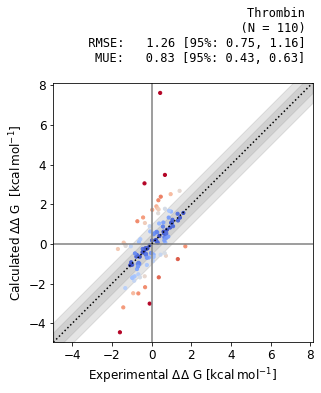

In [140]:
# make this less clunky
colors = {'Thrombin':'hotpink','Jnk1':'purple'}
graph_index = {'Thrombin':0,'Jnk1':1}

for t in ['Thrombin']:
    x = []
    y = []
    y_err = []
    for d in details.values():
        if len(d) == 8: # length will be 4 if calc is missing
            target = d['protein_pdb'].split('_')[0]
            if t != target:
                continue
            calc_kcal = (d['calculated']*kT).value_in_unit(unit.kilocalories_per_mole)
            calc_err_kcal = (d['calculated_err']*kT).value_in_unit(unit.kilocalories_per_mole)
            x.append(d['experimental'])
            y.append(calc_kcal)
            y_err.append(calc_err_kcal)
    plotting._master_plot(np.asarray(x),np.asarray(y),title=t)

{('Thrombin', 0, 1): -0.3720245642407055, ('Thrombin', 0, 2): -1.0839371775781608, ('Thrombin', 0, 3): -1.7608234190532346, ('Thrombin', 0, 4): -1.0020699321989888, ('Thrombin', 0, 5): -1.7782222700313781, ('Thrombin', 0, 6): -1.1490311990814437, ('Thrombin', 0, 7): -3.1127141908444886, ('Thrombin', 0, 8): 12.775020922817774, ('Thrombin', 0, 9): -0.9086655781697828, ('Thrombin', 0, 10): 0.8187920948955332, ('Thrombin', 1, 2): -0.7274564610037686, ('Thrombin', 1, 3): -1.0755246912200058, ('Thrombin', 1, 4): 1.3855584784494788, ('Thrombin', 1, 5): -0.769599488190881, ('Thrombin', 1, 6): -1.4436501547552947, ('Thrombin', 1, 7): -2.570066922945276, ('Thrombin', 1, 8): 0.5596182112614176, ('Thrombin', 1, 9): -0.7784251190452709, ('Thrombin', 1, 10): 0.10555371884427023, ('Thrombin', 2, 3): -0.6112740357587354, ('Thrombin', 2, 4): -1.282874031387916, ('Thrombin', 2, 5): -2.8253020165111717, ('Thrombin', 2, 6): 3.9965193490184294, ('Thrombin', 2, 7): -0.8462746027244012, ('Thrombin', 2, 8): 1

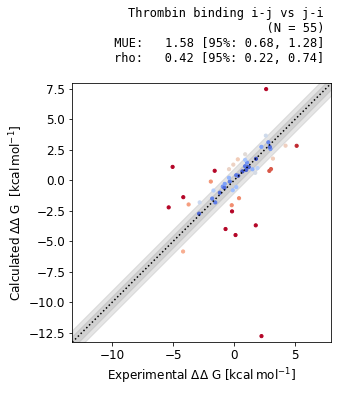

In [141]:
minimal = {}
for d in details.values():
    if len(d) == 8:
        target = d['protein_pdb'].split('_')[0]
        minimal[(target,d['start_ligand'],d['end_ligand'])] = d['calculated']
print(minimal)
for target in ['Thrombin']:
    all_x = [minimal[t,i,j] for t,i,j in minimal.keys() if t == target and j < i and (t,j,i) in minimal.keys()]
    all_y = [-minimal[t,j,i] for t,i,j in minimal.keys() if t == target and j < i and (t,j,i) in minimal.keys()]
    print(all_x)
    plotting._master_plot(np.asarray(all_x),np.asarray(all_y),statistics=['MUE','rho'],origins=False,title=f'{target} binding i-j vs j-i')
    
    
# NEED TO ADD OPTION TO RELABEL X AND Y AXIS

In [ ]:
minimal = {}
for d in details.values():
    if len(d) == 8:
        target = d['protein_pdb'].split('_')[0]
        minimal[(target,d['start_ligand'],d['end_ligand'])] = np.mean(d['solvent_fes'])

for target in ['Thrombin']:
    all_x = [minimal[t,i,j] for t,i,j in minimal.keys() if t == target and j < i and (t,j,i) in minimal.keys()]
    all_y = [-minimal[t,j,i] for t,i,j in minimal.keys() if t == target and j < i and (t,j,i) in minimal.keys()]
    plotting._master_plot(np.asarray(all_x),np.asarray(all_y),statistics=['MUE','rho'],origins=False,title=f'{target} solvent i-j vs j-i')
    
    
# NEED TO ADD OPTION TO RELABEL X AND Y AXIS

In [ ]:
minimal = {}
for d in details.values():
    if len(d) == 8:
        target = d['protein_pdb'].split('_')[0]
        minimal[(target,d['start_ligand'],d['end_ligand'])] = np.mean(d['complex_fes'])

for target in ['Thrombin']:
    all_x = [minimal[t,i,j] for t,i,j in minimal.keys() if t == target and j < i and (t,j,i) in minimal.keys()]
    all_y = [-minimal[t,j,i] for t,i,j in minimal.keys() if t == target and j < i and (t,j,i) in minimal.keys()]
    plotting._master_plot(np.asarray(all_x),np.asarray(all_y),statistics=['MUE','rho'],origins=False,title=f'{target} complex i-j vs j-i')
    
    
# NEED TO ADD OPTION TO RELABEL X AND Y AXIS

In [ ]:
for d in details.values():
    if len(d) == 8:
        plt.hist(d['solvent_fes'] - d['complex_fes'])
        plt.title(f"{d['start_ligand']} to {d['end_ligand']}")
        plt.show()